# Capstone project: E-commerce Analysis and Time Series Demand Forecasting
Janet Ting, DSIF-6

Notebook 2 of 3

<a id="toc"></a>
# Table of contents
1. **[Project Setup](#setup)**
2. **[Exploratory Data Analysis](#eda)**
3. **[1.Orders on Olist E-Commerce](#orders)**
4. **[2.E-Commerce in Brazil](#brazil)**
5. **[3.E-Commerce Impact on Economy](#economy)**
6. **[4.E-commerce Payment Type Analysis](#payments)**
7. **[5.Products Analysis ](#products)**
8. **[Feature Engineering](#feature_engrg)**
9. **[Summary](#summary)**

<a id="setup"></a>
# [&#8629;](#toc) Project Setup

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline
from matplotlib.gridspec import GridSpec

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
import colorlover as cl
import plotly.offline as py
import plotly.express as px

import json
import requests
import folium
from folium.plugins import FastMarkerCluster, Fullscreen, MiniMap, HeatMap, HeatMapWithTime, LocateControl

# Utilities
from viz_utils import *
from custom_transformers import *

import dataframe_image as dfi
import datetime
import matplotlib.dates as mdates # interface to handle dates, will be used for simple date formatting in figures 
import matplotlib.units as munits # we will use the date converter to handle date and datetime units
import matplotlib.ticker as mtick
import statsmodels.tsa.stattools as smtsa
from statsmodels.graphics.tsaplots import plot_acf

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

<h3> Load datasets </h3>

In [2]:
# load datasets
df_orders_items = pd.read_csv('./datasets/orders_items.csv', index_col=0, 
                              parse_dates=['order_purchase_timestamp', 'order_approved_at', 'order_estimated_delivery_date', 
                                           'order_delivered_customer_date','order_delivered_carrier_date','shipping_limit_date']) #consist of order, customer, order_items
# df_olist = pd.read_csv('./datasets/olist.csv', index_col=0, parse_dates=['order_purchase_timestamp', 'order_approved_at', 'order_estimated_delivery_date', 'order_delivered_customer_date','order_delivered_carrier_date','shipping_limit_date','review_creation_date', 'review_answer_timestamp'])
geolocation_df = pd.read_csv('./datasets/olist_geolocation_dataset.csv')
products_df = pd.read_csv('./datasets/olist_products_dataset.csv')
category_name_df = pd.read_csv('./datasets/product_category_name_translation.csv')
order_payments_df = pd.read_csv('./datasets/olist_order_payments_dataset.csv')
order_reviews_df = pd.read_csv('./datasets/olist_order_reviews_dataset.csv',index_col=0, parse_dates=['review_creation_date', 'review_answer_timestamp'])

In [3]:
# create list of tuples (df, df_name) for datasets
datasets = [(df_orders_items, 'orders_items'),
            # (df_olist, 'olist'),
            (geolocation_df, 'geolocation'),
            (products_df, 'products'),
            (category_name_df, 'category_name'),
            (order_payments_df, 'orders_payments'),
            (order_reviews_df, 'orders_reviews')]

In [4]:
def df_summary(df, df_name):
    """
    Summaries for all the variables in the dataset
    """
    print(df_name, 'dataset')
    print()
    
    # print shape 
    print(df.shape)
    print()
    
    # check for non-null and dtype information
    print("Non-null and Data Types")
    df.info()
    print()
    
    # check for duplicated rows
    print(f'Number of duplicated rows: {df[df.duplicated(keep=False)].shape[0]}')
    # check for any missing values, null or 'M' or '-'
    print(f"Number of missing values: {df.isin([np.nan, 'M', '-']).sum().sum()}")
    # check for any zero values
    print(f"Number of zero values: {df.isin(['0.0','0']).sum().sum()}")
    print()    
    
    # print columns with missing values, nan/ 'M'/ '-'
    print("Columns with missing values:")
    print(df.isin([np.nan,'M','-']).sum()[df.isin([np.nan,'M','-']).sum() > 0].sort_values(ascending=False))
    print()
    
    # print coumns with zero values
    print("Columns with zero values:")
    print(df.isin(['0.0', '0']).sum()[df.isin(['0.0', '0']).sum() > 0])
    print()
    
    print("______________________________________________________\n")

In [5]:
def first_five(df, df_name):
    """
    Show first 5 rows of the dataset
    """
    temp_df = df.head()
    print(f'Frist 5 rows of the Dataframe : {df_name} dataset')
    print()
    display(temp_df)

In [6]:
df_summary(df_orders_items, 'orders_items')

orders_items dataset

(113425, 18)

Non-null and Data Types
<class 'pandas.core.frame.DataFrame'>
Int64Index: 113425 entries, 0 to 113424
Data columns (total 18 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       113425 non-null  object        
 1   customer_id                    113425 non-null  object        
 2   order_status                   113425 non-null  object        
 3   order_purchase_timestamp       113425 non-null  datetime64[ns]
 4   order_approved_at              113264 non-null  datetime64[ns]
 5   order_delivered_carrier_date   111457 non-null  datetime64[ns]
 6   order_delivered_customer_date  110196 non-null  datetime64[ns]
 7   order_estimated_delivery_date  113425 non-null  datetime64[ns]
 8   customer_unique_id             113425 non-null  object        
 9   customer_zip_code_prefix       113425 non-null  int64         
 10  customer

In [7]:
first_five(df_orders_items, 'orders_items')

Frist 5 rows of the Dataframe : orders_items dataset



,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,1.0,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72


<a id="eda"></a>
# [&#8629;](#toc) Exploratory Data Analysis 

In this section, we will go through an exploratory data analysis to get insights from E-Commerce in Brazil. This ahs been divided into topics that we can explore graphics for each subject (orders, customers, products, items, and others).

<a id="orders"></a>
# [&#8629;](#toc) 1.Total Orders on Olist E-Commerce

E-Commerce is acknowledged as a growing trend in a global perspective. Let's dive into the orders dataset to see how this trend can be presented in Brazil, at least on the dataset range.

From the `order` dataset columns, we can see orders with 8 different `status` and with different timestamp columns like `purchase`, `approved`, `delivered_carrier`, `delivered_customer` and `estimated delivery`. 

First of all, let's look at the status of the orders we have in this dataset.

___
#### Q1. How many orders do we have for each status?
___
Merging customers_df to orders_df on `customer_id`, then plot on the count for each order_status.

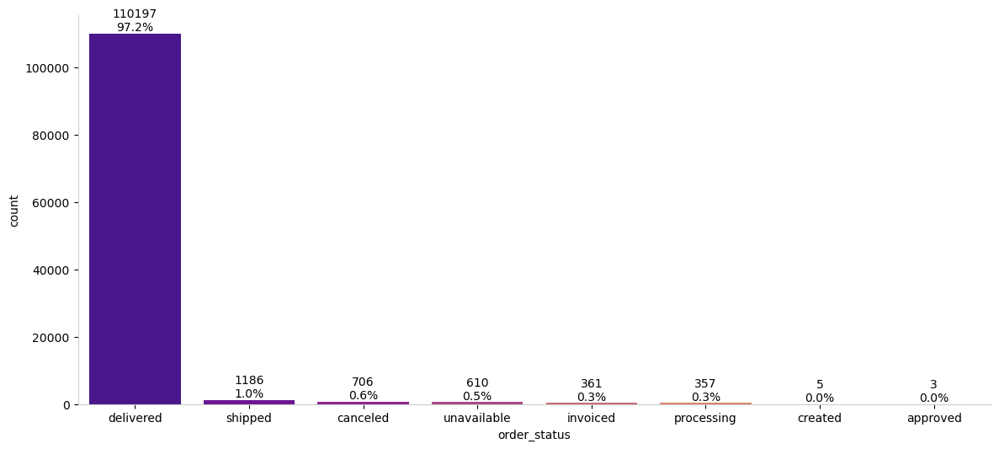

In [8]:
# plot count of orders status 
fig, ax = plt.subplots(figsize=(14, 6))
single_countplot(df_orders_items, x='order_status', ax=ax)
plt.show()

From the statistics graph above, the status with highest count of the orders is *delivered* (97%). Whileas the remaining orders is spread among the other statuses.

___
#### Q2. Is there a growing trend on e-commerce in Brazil? How can we describe a complete scenario?
___
Next, we will be diving into the evolution of e-commerce in terms of purchase orders. For this, we need to extract info on the `order_purchase_timestamp` following the topics:

1. Transform timestamp columns;
2. Extract time attributes from these datetime columns (year, month, day, day of the week and hour);
3. Evaluate the e-commerce scenario using this attributes. 

In [9]:
# extract attributes for purchase date - Year and Month
df_orders_items['order_purchase_year'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.year)
df_orders_items['order_purchase_month'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.month)
df_orders_items['order_purchase_year_month'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m'))
df_orders_items['order_purchase_month_name'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.strftime('%b'))
df_orders_items['order_purchase_date'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m%d'))

# extract attributes for purchase date - Day and Day of Week
df_orders_items['order_purchase_day'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.day)
df_orders_items['order_purchase_dayofweek'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.dayofweek)
df_orders_items['order_purchase_dayofweek_name'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.strftime('%a'))

# extract attributes for purchase date - Hour and Time of the Day
df_orders_items['order_purchase_hour'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.hour)
hours_bins = [-0.1, 6, 12, 18, 23]
hours_labels = ['Dawn', 'Morning', 'Afternoon', 'Night']
df_orders_items['order_purchase_time_day'] = pd.cut(df_orders_items['order_purchase_hour'], hours_bins, labels=hours_labels)

# new DataFrame after transformations
df_orders_items.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2017,10,201710,Oct,20171002,2,0,Mon,10,Morning
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,2018,7,201807,Jul,20180724,24,1,Tue,20,Night
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,2018,8,201808,Aug,20180808,8,2,Wed,8,Morning


<AxesSubplot:xlabel='order_purchase_hour', ylabel='order_purchase_dayofweek_name'>

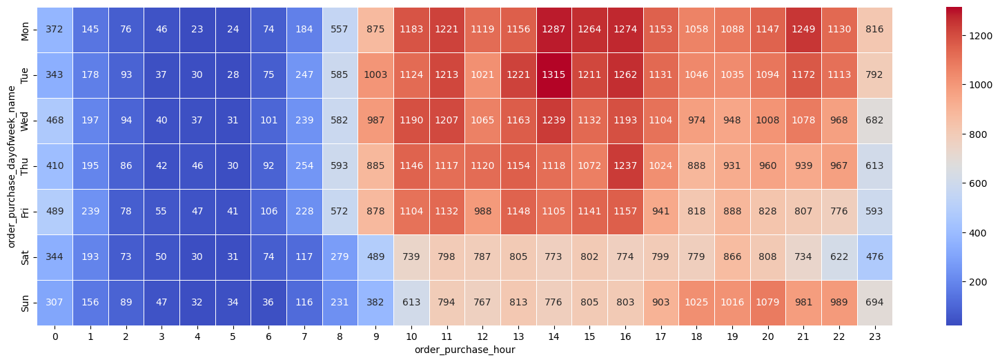

In [10]:
# heatmap of orders count throughout hour and day of week
purchase_df = df_orders_items[['order_purchase_dayofweek_name','order_purchase_hour','order_id']]
purchase_count = purchase_df.groupby(by=['order_purchase_dayofweek_name','order_purchase_hour']).count()['order_id'].unstack()
purchase_count = purchase_count.reindex(index =['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.figure(figsize=(20,6))
sns.heatmap(purchase_count, cmap = 'coolwarm',annot=True, fmt='.0f' ,linewidths = 0.5)

Customers tend to shop online on weekdays from 10am to 5pm. There are sudden peaks on Monday-Wednesday night around 8-9pm and on Sunday evening 6-8pm. Online shopping count is relatively low on Saturday.

<AxesSubplot:xlabel='hour', ylabel='dayofweek'>

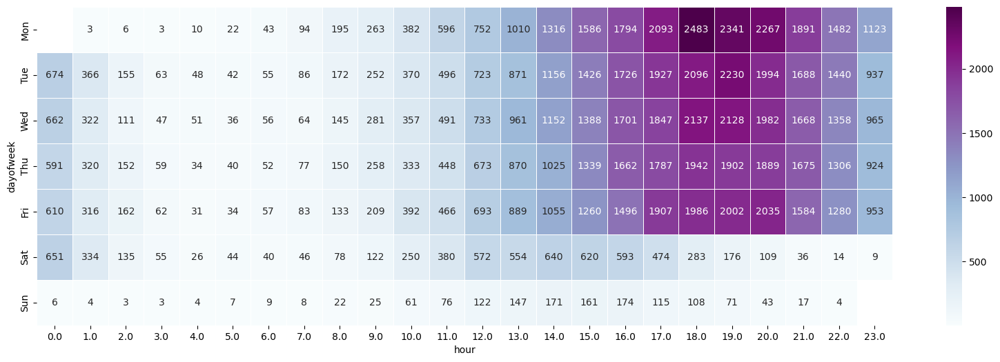

In [11]:
# heatmap of orders delivered count throughout hour and day of week
dweekday = df_orders_items['order_delivered_customer_date'].dt.weekday
dhour = df_orders_items['order_delivered_customer_date'].dt.hour
df_orders_items['delivery_accuracy'] = ((df_orders_items['order_estimated_delivery_date'] - df_orders_items['order_delivered_customer_date'])/(np.timedelta64(1, 'D')))
df_orders_items['total_value'] = df_orders_items['price'].add(df_orders_items['freight_value'])
dprice = df_orders_items['total_value']
delivery = pd.DataFrame({'dayofweek': dweekday, 'hour': dhour, 'price': dprice})
delivery['dayofweek'] = delivery['dayofweek'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
delivery_count = delivery.groupby(['dayofweek', 'hour']).count()['price'].unstack()
plt.figure(figsize=(20,6))
sns.heatmap(delivery_count.reindex(index = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']), 
            cmap="BuPu", annot=True, fmt=".0f", linewidths=0.5)

The heatmap above shows that Weekday 2-10pm are the busiest time for delivery operators. Morning periods is generally the time with less deliveries. 

We could generate a complete analysis on orders amount of Brazilian e-Commerce during the period of the dataset. For that, let's use `GridSpec` to plot three graphs serve to answer the following questions:
1. Is there growing trend on Brazilian e-Commerce?
2. Which day of the week does Brazilian customers tend to purchase things online?
3. What time of the day does Brazilian customers prone to purchase online? (Dawn, Morning, Afternoon, Night)

In [12]:
# check the huge decrease in orders after Aug 2018
df_orders_items[df_orders_items['order_purchase_year_month'] > '201808'].head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,delivery_accuracy,total_value
2040,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaT,NaT,NaT,2018-10-17,08642cd329066fe11ec63293f714f2f8,33030,santa luzia,MG,NaN,NaN,NaN,NaT,NaN,NaN,2018,9,201809,Sep,20180920,20,3,Thu,13,Afternoon,NaN,NaN
5809,ea844c92cf978ea23321fa7fe5871761,6ddc45ad08e6a2c885ca2255fc52d6df,canceled,2018-09-13 09:56:12,NaT,NaT,NaT,2018-09-27,c1ee153508c6b785b491443a95ff364e,89300,mafra,SC,NaN,NaN,NaN,NaT,NaN,NaN,2018,9,201809,Sep,20180913,13,3,Thu,9,Morning,NaN,NaN
11304,87ae60ef8b08ae0e5f903cacb53a6904,fea4d57ed3a45455f89c25ef3dae8ee8,canceled,2018-09-11 16:45:54,NaT,NaT,NaT,2018-09-26,09687a7b7431a93b5c53b50ba779bf94,12010,taubate,SP,NaN,NaN,NaN,NaT,NaN,NaN,2018,9,201809,Sep,20180911,11,1,Tue,16,Afternoon,NaN,NaN


In [13]:
# descriptive statistics of orders after Aug 2018  
df_orders_items[df_orders_items['order_purchase_year_month'] > '201808'].describe()

,customer_zip_code_prefix,order_item_id,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_day,order_purchase_dayofweek,order_purchase_hour,delivery_accuracy,total_value
count,20.000000,1.0,1.0,1.00,20.0,20.000000,20.000000,20.000000,20.000000,0.0,1.00
mean,23613.450000,1.0,145.0,21.46,2018.0,9.200000,11.500000,1.550000,14.300000,NaN,166.46
std,21165.989145,NaN,NaN,NaN,0.0,0.410391,8.642003,1.468081,3.757099,NaN,NaN
min,2989.000000,1.0,145.0,21.46,2018.0,9.000000,1.000000,0.000000,8.000000,NaN,166.46
25%,10575.000000,1.0,145.0,21.46,2018.0,9.000000,3.000000,0.000000,10.750000,NaN,166.46
50%,20426.000000,1.0,145.0,21.46,2018.0,9.000000,10.500000,1.500000,15.000000,NaN,166.46
75%,30330.000000,1.0,145.0,21.46,2018.0,9.000000,17.000000,3.000000,17.250000,NaN,166.46
max,89300.000000,1.0,145.0,21.46,2018.0,10.000000,29.000000,5.000000,20.000000,NaN,166.46


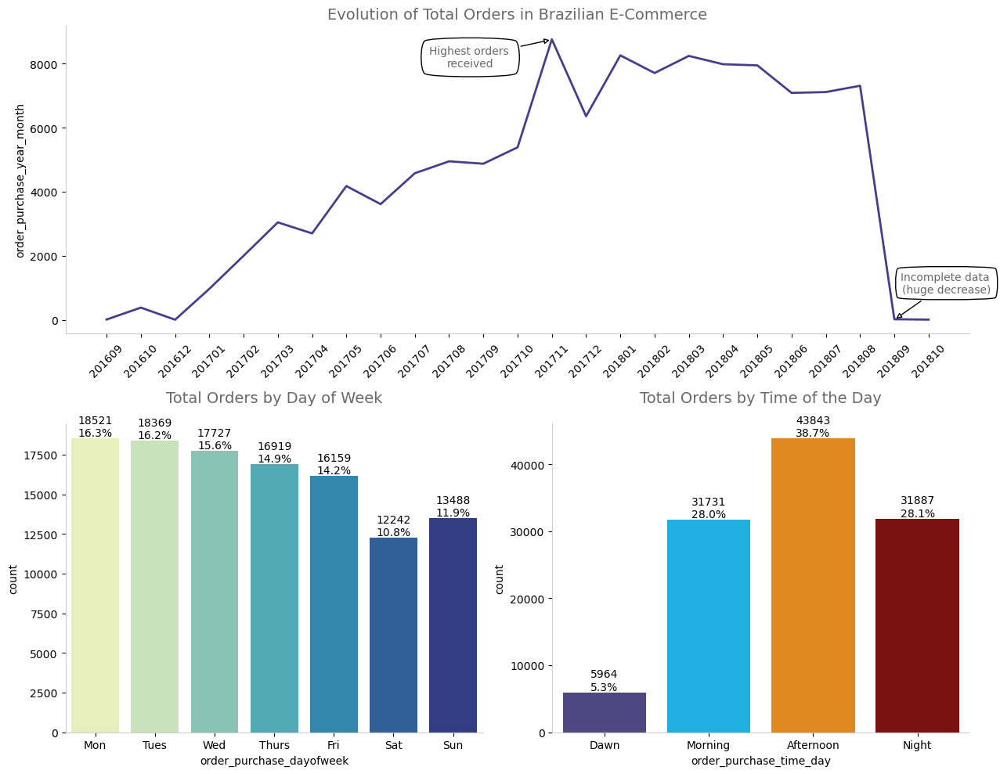

In [14]:
fig = plt.figure(constrained_layout = True, figsize = (13,10))

# axis definition
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1])

# Lineplot - Evolution of e-Commerce orders along time
sns.lineplot(data = df_orders_items['order_purchase_year_month'].value_counts().sort_index(), ax=ax1, color='darkslateblue', linewidth=2)
ax1.annotate(f'Highest orders \nreceived', (13,8750), 
             xytext =(-75, -25), textcoords ="offset points", bbox =dict(boxstyle ="round4", fc ="w", pad =0.8),
             arrowprops =dict(arrowstyle ="-|>", fc ="w"), color ="dimgrey", ha ="center")
ax1.annotate(f'Incomplete data \n(huge decrease)', (23,0), 
             xytext =(48, 25), textcoords ="offset points", bbox =dict(boxstyle ="round4", fc ="w", pad =0.5),
             arrowprops =dict(arrowstyle ="-|>", fc ="w"), color ="dimgrey", ha ="center")
format_spines(ax1, right_border=False)

for tick in ax1.get_xticklabels():
    tick.set_rotation(45)
ax1.set_title('Evolution of Total Orders in Brazilian E-Commerce', size =14, color ='dimgrey')

# Barchart - Total of orders by Day of the Week
single_countplot(df_orders_items, x ='order_purchase_dayofweek', ax =ax2, order =False, palette ='YlGnBu')
weekday_label = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat', 'Sun']
ax2.set_xticklabels(weekday_label)
ax2.set_title('Total Orders by Day of Week', size =14, color ='dimgrey', pad =20)

# Barchart - Total of orders by Time of the Day
time_color_list = ['darkslateblue', 'deepskyblue', 'darkorange', 'darkred']
single_countplot(df_orders_items, x='order_purchase_time_day', ax =ax3, order =False, palette =time_color_list)
ax3.set_title('Total Orders by Time of the Day', size =14, color ='dimgrey', pad =20)
                   
plt.tight_layout()
plt.show()

From the charts above, we comment that:
- E-Commerce in Brazil has positive growing trend along the time. There is some seasonality with peaks at certain months, in general we clearly see that customers are more keen to buy things online than before.
- Monday and Tuesday are the preferred days for Brazilian customers and more puchases are made in the afternoon.
- There is sharp decrease after August 2018, it may due to the noise on data or incomplete data. For further comparison between 2017 and 2018, we will focus and consider orders between January and August for both years. 

___
#### Q3. E-commerce: a comparison between 2017 and 2018
___

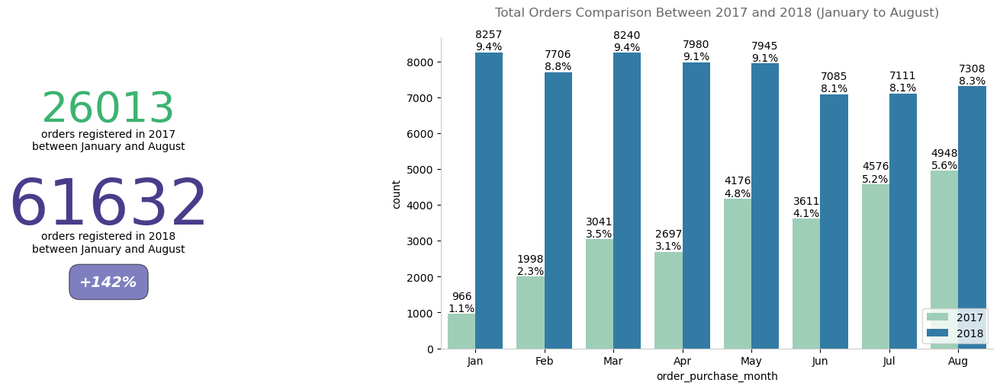

In [15]:
# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(13, 5))

# Axis definition
gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])

# Annotation - Grown on e-commerce orders between 2017 and 2018
df_orders_compare = df_orders_items.query('order_purchase_year in (2017, 2018) & order_purchase_month <= 8')
year_orders = df_orders_compare['order_purchase_year'].value_counts()
growth = int(round(100 * (1 + year_orders[2017] / year_orders[2018]), 0))
ax1.text(0.00, 0.73, f'{year_orders[2017]}', fontsize=40, color='mediumseagreen', ha='center')
ax1.text(0.00, 0.64, 'orders registered in 2017\nbetween January and August', fontsize=10, ha='center')
ax1.text(0.00, 0.40, f'{year_orders[2018]}', fontsize=60, color='darkslateblue', ha='center')
ax1.text(0.00, 0.31, 'orders registered in 2018\nbetween January and August', fontsize=10, ha='center')
signal = '+' if growth > 0 else '-'
ax1.text(0.00, 0.20, f'{signal}{growth}%', fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax1.axis('off')

# Bar chart - Comparison between monthly sales between 2017 and 2018
single_countplot(df_orders_compare, x='order_purchase_month', hue='order_purchase_year', ax=ax2, order=False,
                 palette='YlGnBu')
month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug']
ax2.set_xticklabels(month_label)
ax2.set_title('Total Orders Comparison Between 2017 and 2018 (January to August)', size=12, color='dimgrey', pad=20)
plt.legend(loc='lower right')
plt.show()

Between January and August, total orders registered in 2018 has 142% more than in 2017.

<a id="brazil"></a>
# [&#8629;](#toc) 2.E-Commerce in Brazil

For preparing the data to a workaround analysis on brazilian's states e-commerce, we will take the following steps:
 
1. Use an API (brazilian government) to return the region of each customer_state;
2. Incorporate region data with orders_items
3. Remove any possible outliers
4. Prepare useful charts to answer business questions.

* Brazilian APIs ans links for geolocation info:

        https://servicodados.ibge.gov.br/api/docs/localidades?versao=1
        
Thanks to `Andre Sionek` that threated the geolocation lat and long on his kernel!

In [16]:
# Using the API to incorporate the region to the data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
br_info = pd.DataFrame(content)
br_info.head(3)

,id,sigla,nome,regiao
0,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
1,11,RO,Rondônia,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"
2,12,AC,Acre,"{'id': 1, 'sigla': 'N', 'nome': 'Norte'}"


In [17]:
# Combine `nome` & `regiao`, then drop duplicates
br_info['nome_regiao'] = br_info['regiao'].apply(lambda x: x['nome'])
br_info.drop('regiao', axis=1, inplace=True)
br_info.drop_duplicates(inplace=True)
print(br_info['nome_regiao'].unique())

# make into csv file
br_info.to_csv('./datasets/brazilian_region.csv')

['Norte' 'Nordeste' 'Sudeste' 'Sul' 'Centro-Oeste']


In [18]:
# points of the compass in Portuguese
br_compass = pd.DataFrame({'nome_regiao':['Norte','Nordeste','Este','Sudeste','Sul','Sudoeste','Oeste','Noroeste','Centro-Oeste'], 
                           'name_region':['north','northeast','east','southeast','south','southwest','west','northwest','midwest']})
br_compass

,nome_regiao,name_region
0,Norte,north
1,Nordeste,northeast
2,Este,east
3,Sudeste,southeast
4,Sul,south
5,Sudoeste,southwest
6,Oeste,west
7,Noroeste,northwest
8,Centro-Oeste,midwest


In [19]:
# Threating geolocations that's outside brazilian map -- outliers
# use DMS to ss converter [https://www.latlong.net/degrees-minutes-seconds-to-decimal-degrees]
# Brazil locations coordinates [https://en.wikipedia.org/wiki/Geography_of_Brazil#Locations]
# Brazils most Northern spot is at 5°16'10"/ 5 deg 16′ 27.8″ N latitude.;
geo_prep = geolocation_df[geolocation_df.geolocation_lat <= 5.26944444]
# Brazil’s most Western spot is at 73°58'59"/ 73 deg, 58′ 58.19″W longitude.
geo_prep = geo_prep[geo_prep.geolocation_lng >= -73.98305556]
# Brazil’s most southern spot is at 33°45'03"/ 33 deg, 45′ 04.21″ S latitude.
geo_prep = geo_prep[geo_prep.geolocation_lat >= -33.75083333]
# Brazil’s most Eastern spot is 34°47'35"/ 34 deg, 47′ 35.33″ W longitude.
geo_prep = geo_prep[geo_prep.geolocation_lng <=  -34.79305556]
geo_group = geo_prep.groupby(by='geolocation_zip_code_prefix', as_index=False).min()
geo_group.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1001,-23.551427,-46.634410,sao paulo,SP
1,1002,-23.548878,-46.636361,sao paulo,SP
2,1003,-23.549083,-46.637157,sao paulo,SP


In [20]:
# Merging all the informations
df_orders_items = df_orders_items.merge(br_info, how='left', left_on='customer_state', right_on='sigla')
df_orders_items = df_orders_items.merge(br_compass, how='left', on='nome_regiao').drop(columns=['nome_regiao'])
df_orders_items = df_orders_items.merge(geo_group, how='left', left_on='customer_zip_code_prefix', 
                                        right_on='geolocation_zip_code_prefix')
print(df_orders_items.shape)

df_orders_items.head()

(113425, 39)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,delivery_accuracy,total_value,id,sigla,nome,name_region,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2017,10,201710,Oct,20171002,2,0,Mon,10,Morning,7.107488,38.71,35,SP,São Paulo,southeast,3149.0,-23.583885,-46.587473,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,2018,7,201807,Jul,20180724,24,1,Tue,20,Night,5.355729,141.46,29,BA,Bahia,northeast,47813.0,-12.945892,-45.016313,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,2018,8,201808,Aug,20180808,8,2,Wed,8,Morning,17.245498,179.12,52,GO,Goiás,midwest,75265.0,-16.752735,-48.522139,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,2017,11,201711,Nov,20171118,18,5,Sat,19,Night,12.980069,72.20,24,RN,Rio Grande do Norte,northeast,59296.0,-5.778488,-35.281450,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,1.0,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,2018,2,201802,Feb,20180213,13,1,Tue,21,Night,9.238171,28.62,35,SP,São Paulo,southeast,9195.0,-23.760018,-46.524784,santo andre,SP


___
#### Overview of customers' order by region, state and city
___

In [21]:
# Filtering data between 201701 to 201808
df_orders_filter = df_orders_items[(df_orders_items['order_purchase_year_month'].astype(int) >= 201701)]
df_orders_filter = df_orders_filter[(df_orders_filter['order_purchase_year_month'].astype(int) <= 201808)]
df_orders_filter.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,delivery_accuracy,total_value,id,sigla,nome,name_region,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2017,10,201710,Oct,20171002,2,0,Mon,10,Morning,7.107488,38.71,35,SP,São Paulo,southeast,3149.0,-23.583885,-46.587473,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,2018,7,201807,Jul,20180724,24,1,Tue,20,Night,5.355729,141.46,29,BA,Bahia,northeast,47813.0,-12.945892,-45.016313,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,2018,8,201808,Aug,20180808,8,2,Wed,8,Morning,17.245498,179.12,52,GO,Goiás,midwest,75265.0,-16.752735,-48.522139,vianopolis,GO


In [22]:
# Grouping data by region
df_regions_group = df_orders_filter.groupby(by=['order_purchase_year_month', 'name_region'], as_index=False)
df_regions_group = df_regions_group.agg({'customer_id': 'count', 'price': 'sum'}).sort_values(by='order_purchase_year_month')

# rename the columns
df_regions_group.columns = ['year_month', 'region', 'order_count', 'order_amount']
df_regions_group.reset_index(drop=True, inplace=True)

print(df_regions_group.shape)
df_regions_group.head(3)

(100, 4)


,year_month,region,order_count,order_amount
0,201701,midwest,65,8179.76
1,201701,north,22,4127.95
2,201701,northeast,78,10951.37


In [23]:
# Grouping data by city (top 10)
df_cities_group = df_orders_filter.groupby(by='geolocation_city',as_index=False).count().loc[:, ['geolocation_city', 'order_id']]
df_cities_group = df_cities_group.sort_values(by='order_id', ascending=False).reset_index(drop=True)
df_cities_group = df_cities_group.iloc[:10, :]
# rename the columns
df_cities_group.columns = ['geolocation_city', 'order_count']

print(df_cities_group.shape)
df_cities_group.head()

(10, 2)


,geolocation_city,order_count
0,sao paulo,17843
1,rio de janeiro,7843
2,belo horizonte,3162
3,brasilia,2203
4,curitiba,1733


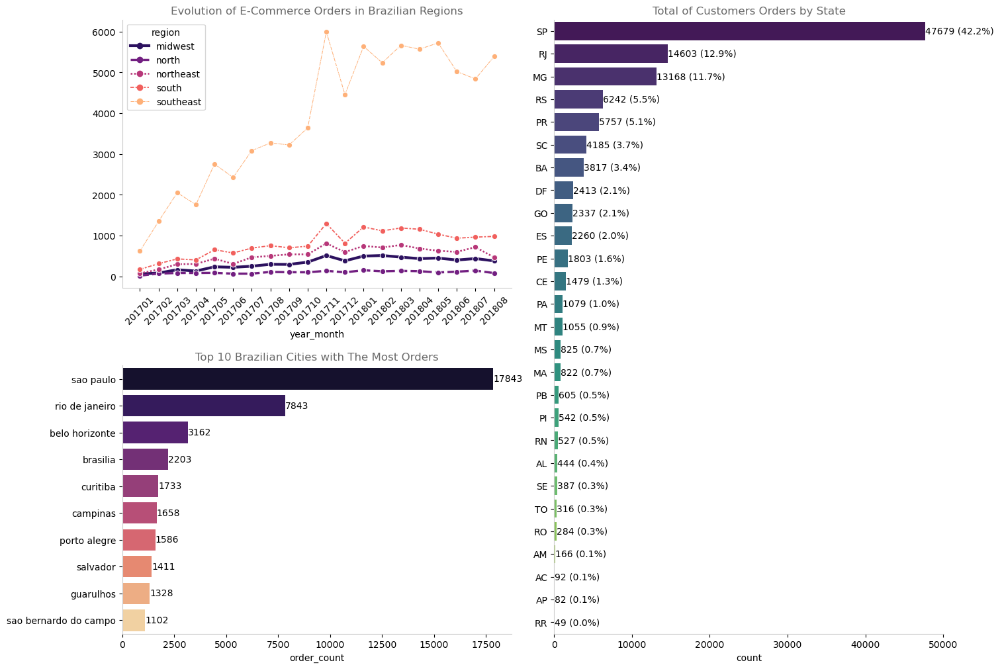

In [24]:
# Creating and preparing figure and axis
fig = plt.figure(constrained_layout=True, figsize=(15, 10))
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])

# Count of orders by region
sns.lineplot(x='year_month', y='order_count', ax=ax1, data=df_regions_group, hue='region', 
             size='region', style='region', palette='magma', markers=['o'] * 5)
format_spines(ax1, right_border=False)
ax1.set_title('Evolution of E-Commerce Orders in Brazilian Regions', size=12, color='dimgrey')
ax1.set_ylabel('')
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

# Top cities with the most customers orders in Brazil
sns.barplot(y='geolocation_city', x='order_count', data=df_cities_group, ax=ax2, palette='magma')
AnnotateBars(n_dec=0, font_size=10, color='black').horizontal(ax2)
format_spines(ax2, right_border=False)
ax2.set_title('Top 10 Brazilian Cities with The Most Orders', size=12, color='dimgrey')
ax2.set_ylabel('')

# Total orders by state
single_countplot(y='customer_state', ax=ax3, df=df_orders_filter, palette='viridis')
ax3.set_title('Total of Customers Orders by State', size=12, color='dimgrey')
ax3.set_ylabel('')

plt.show()

There are five main regions where the purchases demand are coming from, top region being the southeast. [São Paulo is the most populous city in Brazil](https://en.wikipedia.org/wiki/S%C3%A3o_Paulo), it has the highest number of sales among all. Follows by city Rio de Janeiro (capital of Brazil 1763-1960). While the current capital of Brazil, Brasilia, is the fourth capital with most orders.

#### How customers are distributed in Brazil? (a 30k orders sample from 2018 on a map)

___
* _How customers are distributed in Brazil? (a 30k orders sample from 2018 on a map)_
___

#### Folium library
Folium is a tool that makes mapping great while all the work is done in the back end. It's a Python wrapper for a tool called leaflet.js. We basically give it minimal instructions, JS does loads of work in the background and gives us very cool maps. For clarity, the map is technically called a **'Leaflet Map'**. 

In [25]:
# Zipping locations
lats = list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lat'].dropna().values)[:30000]
longs = list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lng'].dropna().values)[:30000]
locations = list(zip(lats, longs))
print(len(locations))
locations[:5]

30000


[(-12.945892499999994, -45.01631292123874),
 (-16.75273470581975, -48.522138856098245),
 (-23.76001848099613, -46.524784094929146),
 (-20.5341929390327, -43.70059246490091),
 (-23.7204714657222, -46.69178198889149)]

In [26]:
# Creating a map using folium
map1 = folium.Map(location=[-15, -50], zoom_start=4.0) # Uses lat then lon. The bigger the zoom number, the closer in you get

# Plugin: FastMarkerCluster
FastMarkerCluster(data=locations).add_to(map1)

map1

#### HeatMaps: a good representation of the location of core of brazilian e-commerce customers

___
* _**HeatMaps:** a good representation of the location of core of brazilian e-commerce customers_
___

From the map above, we are informed by the insight that the highest number of e-Commerce orders are generated from the southeast of Brazil. Now, let's see it in a HeatMap!

In [27]:
# Grouping geolocation data for plotting a heatmap
heat_data = df_orders_filter.groupby(by=['geolocation_lat', 'geolocation_lng'], as_index=False).count().iloc[:, :3]
print(heat_data.shape)
heat_data.head() 

(14828, 3)


,geolocation_lat,geolocation_lng,order_id
0,-33.692616,-53.480201,5
1,-33.665029,-53.380296,15
2,-32.569765,-53.399955,10
3,-32.244875,-53.092851,4
4,-32.205312,-52.182998,1


In [28]:
# Creating a map using folium
map2 = folium.Map(location=[-15, -50], zoom_start=4.0, tiles='cartodbdark_matter')

# Plugin: HeatMap
HeatMap(name='Heat Map', data=heat_data, radius=10, max_zoom=13).add_to(map2)

map2

#### Heatmap with Time

**Nice!** Another good command to plot is the folium plugin _[HeatMapWithTime](https://nbviewer.jupyter.org/github/python-visualization/folium/blob/master/examples/HeatMapWithTime.ipynb)_ to see the evolution of e-commerce orders among time.

There was [limitations](https://github.com/python-visualization/folium/issues/859) (i.e. jupyter and Chrome limitations for total number of points shown at HeatMapWithTime) , we will show the evolution of orders from January 2018 to July 2018.

In [146]:
# Alternative method
epoch_list = []
heatmap_evl_data = df_orders_items[(df_orders_items['order_purchase_year_month'].astype(int) >= 201801)]
heatmap_evl_data = heatmap_evl_data[(heatmap_evl_data['order_purchase_year_month'].astype(int) <= 201807)]
time_index = heatmap_evl_data['order_purchase_year_month'].sort_values().unique()
for epoch in time_index:
    data_temp = heatmap_evl_data.query('order_purchase_year_month == @epoch')
    data_temp = data_temp.groupby(by=['geolocation_lat', 'geolocation_lng'], as_index=False).count()
    data_temp = data_temp.sort_values(by='order_id', ascending=False).iloc[:, :3]
    epoch_list.append(data_temp.values.tolist())
    
# Creating a mapa using folium
map2 = folium.Map(
    location=[-15, -50], 
    zoom_start=4.0, 
    tiles='cartodbdark_matter'
)

# Plugin: HeatMapWithTime
HeatMapWithTime(
    name='Evolution of Orders in a Geolocation Perspective',
    data=epoch_list,
    radius=10,
    index=list(time_index)
).add_to(map2)

map2

<a id="economy"></a>
# [&#8629;](#toc) 3.E-Commerce Impact on Economy

Until now, we just answered questions on E-commerce scenario considering the number of orders received. We could see the volume sales per month, day of week, time of the day and even the geolocation states.

Now, we will analyze the money movement of e-commerce by looking at order prices, freights and others.

#### _How about the e-commerce sales? Did they grow up over time?_

To answear this question, let's first group our data in a way to look at the evolution overall.

In [29]:
# Grouping data
df_month_aggreg = df_orders_filter.groupby(by=['order_purchase_year', 'order_purchase_year_month'], as_index=False)
df_month_aggreg = df_month_aggreg.agg({'order_id': 'count', 'price': 'sum', 'freight_value': 'sum'})

# Adding new columns for analysis
df_month_aggreg['price_per_order'] = df_month_aggreg['price'] / df_month_aggreg['order_id']
df_month_aggreg['freight_per_order'] = df_month_aggreg['freight_value'] / df_month_aggreg['order_id']
print(df_month_aggreg.shape)
# df_month_aggreg.head()

(20, 7)


In [30]:
# sort by order purchase date 
df_orders_filter_1 = df_orders_filter.sort_values(by=['order_purchase_date'])
# df_orders_filter_1.head(3)

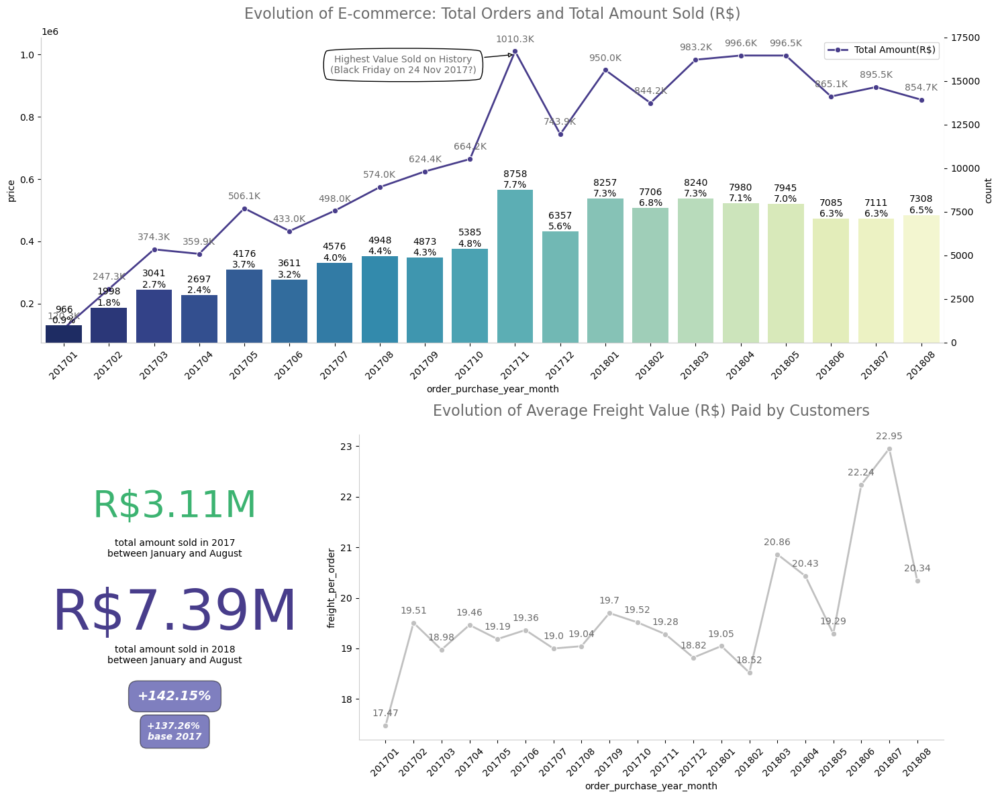

In [31]:
# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1:])

# Plot 1 - Evolution of total orders and total sales on e-commerce
sns.lineplot(x='order_purchase_year_month', y='price', ax=ax1, data=df_month_aggreg, linewidth=2, 
             color='darkslateblue', marker='o', label='Total Amount(R$)')
ax1_twx = ax1.twinx()
single_countplot(df_orders_filter_1, x='order_purchase_year_month', ax=ax1_twx, order=False, palette='YlGnBu_r')
ax1_twx.set_yticks(np.arange(0, 20000, 2500))

# Customizing the first plot
format_spines(ax1)
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)
for x, y in df_month_aggreg.price.items():
    ax1.annotate(str(round(y/1000, 1))+'K', xy=(x, y), textcoords='offset points', xytext=(0, 10),
                ha='center', color='dimgrey')
ax1.annotate(f'Highest Value Sold on History\n(Black Friday on 24 Nov 2017?)', (10, 1000000), xytext=(-120, -20), 
             textcoords='offset points', bbox=dict(boxstyle="round4", fc="w", pad=.8),
             arrowprops=dict(arrowstyle='-|>', fc='w'), color='dimgrey', ha='center')
ax1.set_title('Evolution of E-commerce: Total Orders and Total Amount Sold (R$)', size=16, color='dimgrey', pad=20)

# Plot 2 - Total Numbers of Sales Evolution
month_comparison = ['201701', '201702', '201703', '201704', '201705', '201706', '201707', '201708',
                    '201801', '201802', '201803', '201804', '201805', '201806', '201807', '201808']
df_sales_compare = df_month_aggreg.query('order_purchase_year_month in (@month_comparison)')
sold_2017 = df_sales_compare.query('order_purchase_year == 2017')['price'].sum()
sold_2018 = df_sales_compare.query('order_purchase_year == 2018')['price'].sum()
growth = 1 + (sold_2017 / sold_2018)
growth_base_2017 = (sold_2018 - sold_2017)/sold_2017
ax2.text(0.50, 0.73, 'R$' + str(round(sold_2017/(10**6), 2)) + 'M', fontsize=40, color='mediumseagreen', ha='center')
ax2.text(0.50, 0.60, 'total amount sold in 2017\nbetween January and August', fontsize=10, ha='center')
ax2.text(0.50, 0.36, 'R$' + str(round(sold_2018/(10**6), 2)) + 'M', fontsize=60, color='darkslateblue', ha='center')
ax2.text(0.50, 0.25, 'total amount sold in 2018\nbetween January and August', fontsize=10, ha='center')
signal = '+' if growth > 0 else '-'
ax2.text(0.50, 0.13, f'{signal}{str(round(100 * growth, 2))}%', fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax2.text(0.50, 0.00, f'{signal}{str(round(100 * growth_base_2017, 2))}% \nbase 2017', fontsize=10, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax2.axis('off')

# Plot 3 - Evolution of mean freight value paid by the customers
sns.lineplot(x='order_purchase_year_month', y='freight_per_order', data=df_month_aggreg, linewidth=2, 
             color='silver', marker='o', ax=ax3)
format_spines(ax3, right_border=False)
for tick in ax3.get_xticklabels():
    tick.set_rotation(45)
for x, y in df_month_aggreg.freight_per_order.items():
    ax3.annotate(round(y, 2), xy=(x, y), textcoords='offset points', xytext=(0, 10),
                ha='center', color='dimgrey')
ax3.set_title('Evolution of Average Freight Value (R$) Paid by Customers', size=16, color='dimgrey', pad=20)

plt.tight_layout()
plt.show()

Highest amount sales sold in this dataset was `R$` 1010.3K on November 2017, which was possibly the result of Black Friday (Nov 24). Total sales amount of `R$` 7.39Mil generated between January and Auguest 2018. Freight for most months in 2018 are higher than in 2017. 

#### How is the distribution of the total sales (sum of price) in brazilian states?

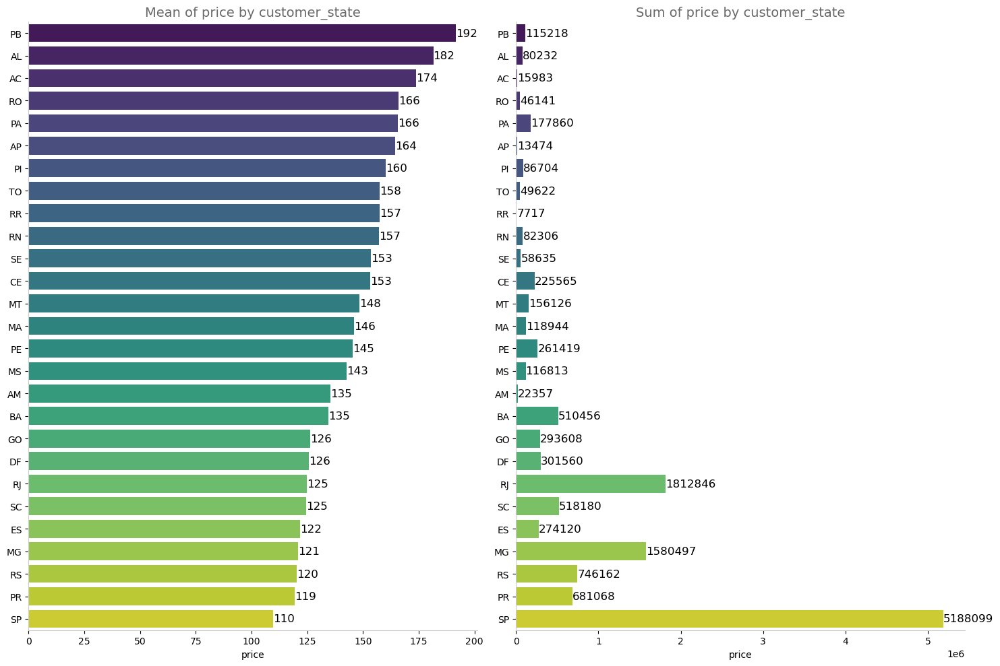

In [32]:
mean_sum_analysis(df= df_orders_filter, group_col='customer_state', value_col='price', palette='viridis', figsize=(15, 10))

It's very interesting to see some states with a high total amount sold but low price per order. For example, in SP (São Paulo) state, it has the most value of e-commerce (5,188,099 sold) but it is also where customers pay less per order (110.00 per order).

#### How is the distribution of the freight cost in brazilian states?

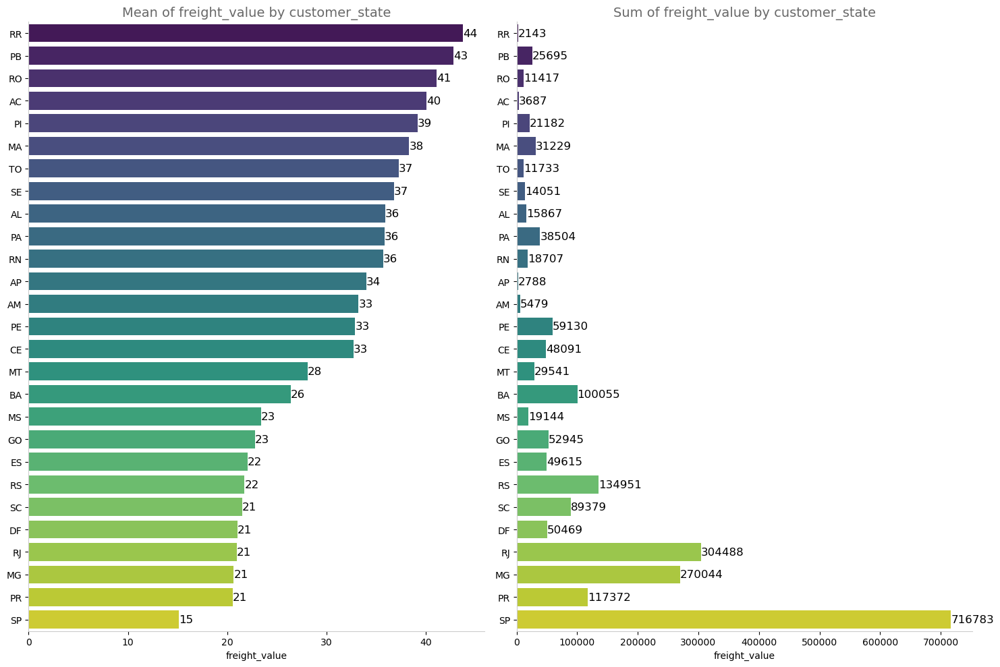

In [33]:
mean_sum_analysis(df= df_orders_filter, group_col='customer_state', value_col='freight_value', palette='viridis', figsize=(15, 10))

Here we can get insights about the customers states with highest mean freight value. For example, customers in Roraima (RR), Paraíba (PB), Rondônia (RO) and Acre (AC) normally pays more than anyone on freights.

#### Where are the best states to buy in Brazil? An analysis on sales, freight and delivery time

In [34]:
# Calculating working days between purchasing, delivering and estimated delivery, 
# invoke the np.busday_count() into `cal_working_days` function
purchasing = df_orders_filter['order_purchase_timestamp']
delivered = df_orders_filter['order_delivered_customer_date']
estimated = df_orders_filter['order_estimated_delivery_date']
df_orders_filter['time_to_delivery'] = calc_working_days(purchasing, delivered, convert=True)
df_orders_filter['diff_estimated_delivery'] = calc_working_days(estimated, delivered, convert=True)
print(df_orders_filter.shape)
# df_orders_filter.head(3)

(113018, 41)


In [35]:
# Grouping data by state
states_avg_grouped = df_orders_filter.groupby(by='customer_state', as_index=False).mean()
states_freight_paid = states_avg_grouped.loc[:, ['customer_state', 'freight_value']]
states_time_to_delivery = states_avg_grouped.loc[:, ['customer_state', 'time_to_delivery']]
states_estimated_delivery = states_avg_grouped.loc[:, ['customer_state', 'diff_estimated_delivery']]

# Sorting data
states_freight_paid = states_freight_paid.sort_values(by='freight_value', ascending=False)
states_time_to_delivery = states_time_to_delivery.sort_values(by='time_to_delivery', ascending=False)
states_estimated_delivery = states_estimated_delivery.sort_values(by='diff_estimated_delivery')

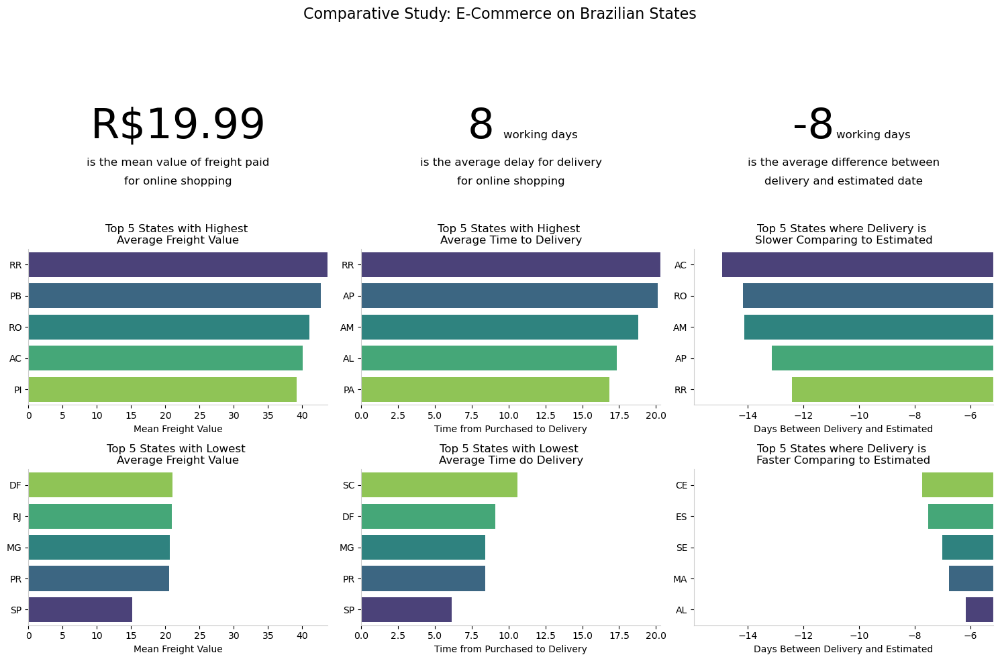

In [36]:
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Plot Pack 01 - Freight value paid on states
sns.barplot(x='freight_value', y='customer_state', data=states_freight_paid.head(), ax=axs[1, 0], palette='viridis')
axs[1, 0].set_title('Top 5 States with Highest \nAverage Freight Value', size=12, color='black')
sns.barplot(x='freight_value', y='customer_state', data=states_freight_paid.tail(), ax=axs[2, 0], palette='viridis_r')
axs[2, 0].set_title('Top 5 States with Lowest \nAverage Freight Value', size=12, color='black')
for ax in axs[1, 0], axs[2, 0]:
    ax.set_xlabel('Mean Freight Value')
    ax.set_xlim(0, states_freight_paid['freight_value'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0, 0].text(0.50, 0.30, f'R${round(df_orders_filter.freight_value.mean(), 2)}', fontsize=45, ha='center')
axs[0, 0].text(0.50, 0.12, 'is the mean value of freight paid', fontsize=12, ha='center')
axs[0, 0].text(0.50, 0.00, 'for online shopping', fontsize=12, ha='center')
axs[0, 0].axis('off')

# Plot Pack 02 - Time to delivery on states
sns.barplot(x='time_to_delivery', y='customer_state', data=states_time_to_delivery.head(), ax=axs[1, 1], palette='viridis')
axs[1, 1].set_title('Top 5 States with Highest \nAverage Time to Delivery', size=12, color='black')
sns.barplot(x='time_to_delivery', y='customer_state', data=states_time_to_delivery.tail(), ax=axs[2, 1], palette='viridis_r')
axs[2, 1].set_title('Top 5 States with Lowest \nAverage Time do Delivery', size=12, color='black')
for ax in axs[1, 1], axs[2, 1]:
    ax.set_xlabel('Time from Purchased to Delivery')
    ax.set_xlim(0, states_time_to_delivery['time_to_delivery'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')
    
# Annotations
axs[0, 1].text(0.40, 0.30, f'{int(df_orders_filter.time_to_delivery.mean())}', fontsize=45, ha='center')
axs[0, 1].text(0.60, 0.30, 'working days', fontsize=12, ha='center')
axs[0, 1].text(0.50, 0.12, 'is the average delay for delivery', fontsize=12, ha='center')
axs[0, 1].text(0.50, 0.00, 'for online shopping', fontsize=12, ha='center')
axs[0, 1].axis('off')
    
# Plot Pack 03 - Differnece between delivered and estimated on states
sns.barplot(x='diff_estimated_delivery', y='customer_state', data=states_estimated_delivery.head(), ax=axs[1, 2], palette='viridis')
axs[1, 2].set_title('Top 5 States where Delivery is \nSlower Comparing to Estimated', size=12, color='black')
sns.barplot(x='diff_estimated_delivery', y='customer_state', data=states_estimated_delivery.tail(), ax=axs[2, 2], palette='viridis_r')
axs[2, 2].set_title('Top 5 States where Delivery is \nFaster Comparing to Estimated', size=12, color='black')
for ax in axs[1, 2], axs[2, 2]:
    ax.set_xlabel('Days Between Delivery and Estimated')
    ax.set_xlim(states_estimated_delivery['diff_estimated_delivery'].min()-1, 
                states_estimated_delivery['diff_estimated_delivery'].max()+1)
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0, 2].text(0.40, 0.30, f'{int(df_orders_filter.diff_estimated_delivery.mean())}', fontsize=45, ha='center')
axs[0, 2].text(0.60, 0.30, 'working days', fontsize=12, ha='center')
axs[0, 2].text(0.50, 0.12, 'is the average difference between', fontsize=12, ha='center')
axs[0, 2].text(0.50, 0.00, 'delivery and estimated date', fontsize=12, ha='center')
axs[0, 2].axis('off') 
    
plt.suptitle('Comparative Study: E-Commerce on Brazilian States', size=16)
plt.tight_layout()
plt.show()

The mean value of freight paid for online shopping is R$19.99. It generally takes average of 8 working days for online shoppng delivery. While the avearge difference between delivery and estimated date is -8 working days, which means delivery is faster than estimated. 

<a id="payments"></a>
# [&#8629;](#toc) 4.E-commerce Payment Type Analysis

One of the datasets provided have informations about order's payment. To see the influence of payments on e-commerce, we can build a mini-dashboard with main concepts: `payments type` and `payments installments`. The idea is to present enough clarification on how e-commerce customers usually prefer to pay their orders.

In [37]:
# Grouping data
df_orders_pay = df_orders_filter.merge(order_payments_df, how='left', on='order_id')
print(df_orders_pay.shape)
# df_orders_pay.head(3)

(118009, 45)


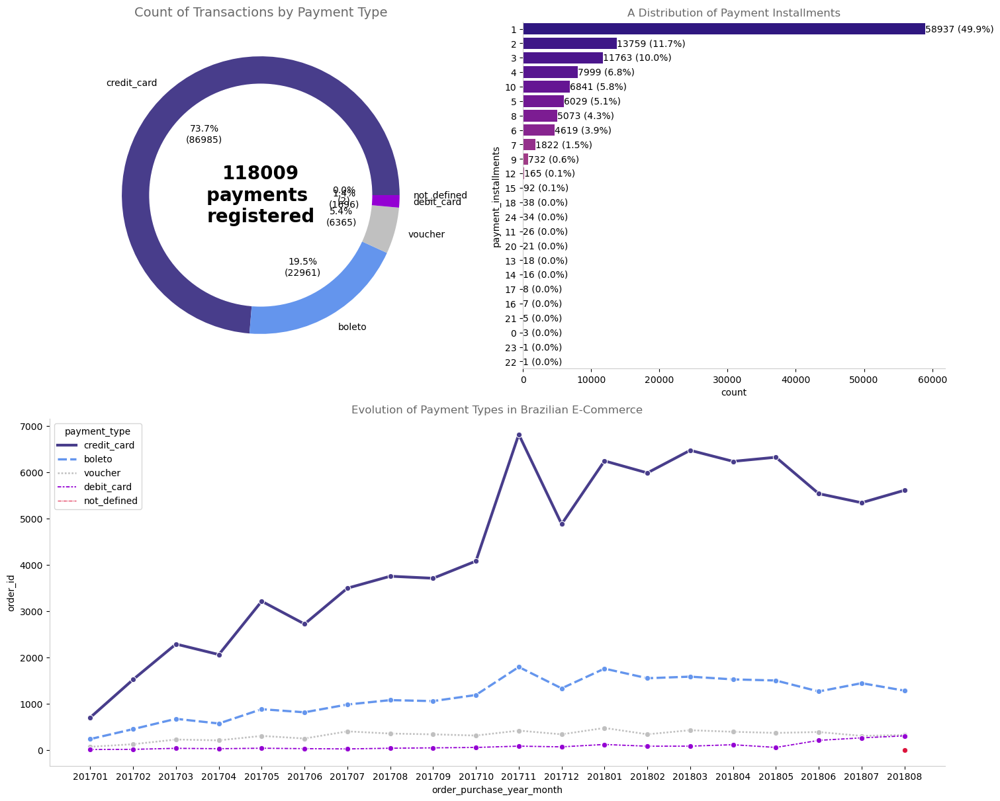

In [38]:
# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

# Plot 1 - Payment types in a donut chart
colors = ['darkslateblue', 'cornflowerblue', 'silver', 'darkviolet', 'crimson']
label_names = df_orders_pay['payment_type'].value_counts().index
donut_plot(df_orders_pay, col='payment_type', ax=ax1, label_names=label_names, colors=colors,
           title='Count of Transactions by Payment Type', text=f'{len(df_orders_pay)}\npayments \nregistered')

# Plot 2 - Payment installments
single_countplot(df_orders_pay, ax=ax2, y='payment_installments')
ax2.set_title('A Distribution of Payment Installments', color='dimgrey', size=12)

# Plot 3 - Evolution of payment types
payment_evo = df_orders_pay.groupby(by=['order_purchase_year_month', 'payment_type'], as_index=False).count()
payment_evo = payment_evo.loc[:, ['order_purchase_year_month', 'payment_type', 'order_id']]
payment_evo = payment_evo.sort_values(by=['order_purchase_year_month', 'order_id'], ascending=[True, False])
sns.lineplot(x='order_purchase_year_month', y='order_id', data=payment_evo, ax=ax3, hue='payment_type',
             style='payment_type', size='payment_type', palette=colors, marker='o')
format_spines(ax3, right_border=False)
ax3.set_title('Evolution of Payment Types in Brazilian E-Commerce', size=12, color='dimgrey')
plt.show()

By the line chart, it's shown that majority of brazilian e-commerce customers made payments by credit card. Since 201805 it's possible to see a slight decrease on this type of payment. On the other hand, payments made by debit card is showing a growing trend since 201805, wich is a good opportunity for investors to improve services for payments like this.

On the bar chart above, we can see how brazilian customers prefer to pay the orders: mostly of them pay all in one installment and it's worth to point out that payment in 10 installments comes after the quantity of payments done in 4 installments.

<a id="products"></a>
# [&#8629;](#toc) 5.Products Analysis 

In this section, let's look into the products range offered within this e-commerce. How was the demand through the years? What are the most welcoming product categories?

<h3>Q1.Orders count for number of products purchased </h3>

In [39]:
# Grouping data
df_orders_items_products = df_orders_items.merge(products_df, how='left', on='product_id').merge(category_name_df, how='left', on='product_category_name')
df_orders_items_products[(~df_orders_items_products['product_category_name'].isna()) & (df_orders_items_products['product_category_name_english'].isna())]['product_category_name'].unique()

array(['portateis_cozinha_e_preparadores_de_alimentos', 'pc_gamer'],
      dtype=object)

In [40]:
# adding munual translation
df_orders_items_products['product_category_name_english'] = np.where(df_orders_items_products['product_category_name'] == 'pc_gamer', 
                                                                     'pc_games', df_orders_items_products['product_category_name_english'])
df_orders_items_products['product_category_name_english'] = np.where(df_orders_items_products['product_category_name'] == 'portateis_cozinha_e_preparadores_de_alimentos', 
                                                                     'portable_cooking_ware', df_orders_items_products['product_category_name_english'])

In [41]:
# Grouping data
df_orders_items_products['product_category_name'] = df_orders_items_products['product_category_name_english']
df_orders_items_products = df_orders_items_products.drop(columns = ['product_category_name_english'])
df_orders_items_products['product_category_name'] = df_orders_items_products['product_category_name'].fillna('missing')
print(df_orders_items_products.shape)
# df_orders_items_products.head(3)

(113425, 47)


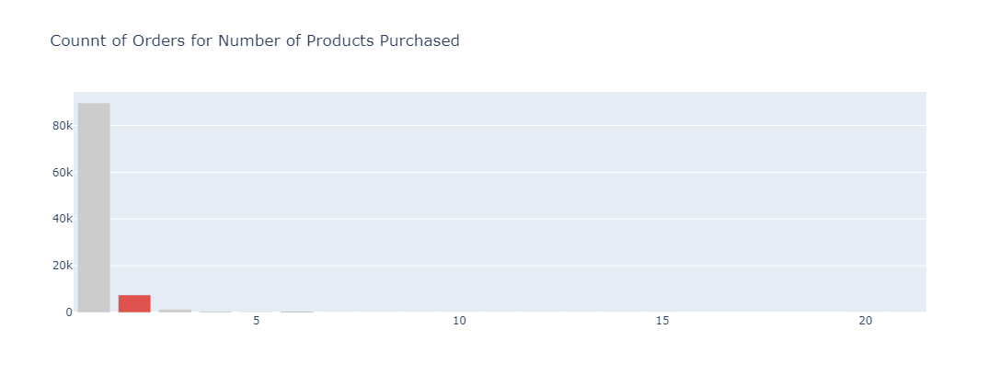

In [42]:
count_products = df_orders_items_products.groupby('order_id').size().value_counts()
trace = go.Bar(
    x= count_products.index,
    y= count_products.values,
    marker=dict(
        color=['rgba(204,204,204,1)', 'rgba(222,45,38,0.8)',
               'rgba(204,204,204,1)', 'rgba(204,204,204,1)',
               'rgba(204,204,204,1)']),
)
layout = go.Layout(title='Counnt of Orders for Number of Products Purchased', height=420, width=800)
fig = go.Figure(data=[trace], layout=layout)
iplot(fig, filename='color-bar')

89638 of customers purchased once (single order_id) while another group of customers (7516) are repeating customers.

<h3>Q2.Products price and Freight value</h3>
To understand the  product pricing strategies from sellers, if sellers continuously change the price of the same item (product_id), we could try to predict price in order to compare the prediction against the history of prices for that product. Before tackling this prediction, it makes sense to check if there is enough price variation for products sold.

In [43]:
# series containing the count of price points found for each product_id
product_price_count = df_orders_items_products.groupby('product_id')['price'].nunique().sort_values(ascending = False) 
product_price_count.describe()

count    32951.000000
mean         1.287002
std          0.893796
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         31.000000
Name: price, dtype: float64

Seems like most products never change prices. This could mean that almost all sellers never change the price of their listed products or that maybe changes/updates to a sellers products produce a new product_id. Before checking if the same product is being sold under a different product_id, let's check the range of prices for the the product that had the most price changes.

In [44]:
# check range of price for product with most price changes
max_count_product_id = product_price_count.index[0]
max_price_count_df = df_orders_items_products[df_orders_items_products['product_id'] == max_count_product_id]
max_price_count_df['price'].describe()

count    155.000000
mean      50.051032
std        2.769751
min       44.980000
25%       47.650000
50%       49.900000
75%       52.600000
max       59.900000
Name: price, dtype: float64

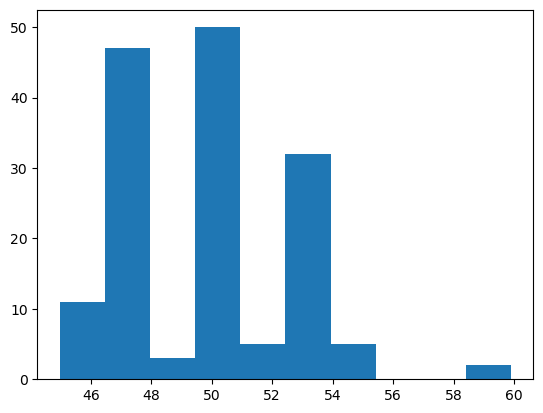

In [45]:
# plot in histogram
plt.hist(max_price_count_df['price']);

The product with the highest number of price points found had 155 different price points, ranging between 44.98 to 59.90.

Before ruling out predicting prices for products, let's see if sellers are selling the same product under a different product_id. We can get a sense of this dynamic by counting the number of products offered by the same seller_id. This is not 100% accurate but can guide us further.

In [46]:
# number of products sold by seller_id
prods_by_seller_df = df_orders_items_products.groupby('seller_id')['product_id'].nunique().sort_values(ascending=False).to_frame(name='unique_product_ids')
prods_by_seller_df.describe()

,unique_product_ids
count,3095.000000
mean,11.130210
std,24.473252
min,1.000000
25%,2.000000
50%,4.000000
75%,10.000000
max,399.000000


We can see that the 75th percentile has only 10 unique products, so we can safely assume that with the available data set, we cannot assume that sellers have several product IDs for the same product. Let's see the kernel density plot for sellers with less than 10 unique product IDs.

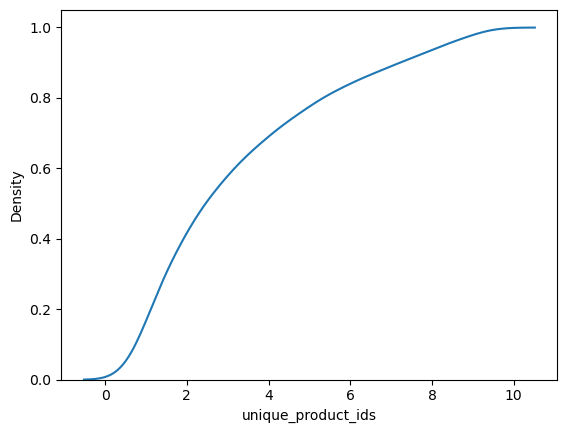

In [47]:
# kde plot for sellers with less than 10 unique product IDs
sns.kdeplot(data=prods_by_seller_df[prods_by_seller_df['unique_product_ids'] < 10], x='unique_product_ids', cumulative=True);

We can see that around 70% of the values correspond to less than 4 unique products for a seller. I will assume that changes to products (updates, etc.) do not change the product_id. Given the low variability in prices and products sold by sellers, we won't be predicting the products' prices.

On the other hand, to understand the dynamics of Olist as marketplace over time is more relevant here. Both supply by sellers and demand from the customers exist in Olist. However, we have no information on when a product was first launched for purchase. This is relevant beacuse it would allow us to analyze the relationship between supply (product availability) and demand (purchase of products). It seems that the product information we have is only related to purchased items which makes it fully derived and dependent from the demand side.

In [48]:
# function to plot distribution
def plot_dist(values, log_values, title, color="#D84E30"):
    fig, axis = plt.subplots(1, 2, figsize=(12,4))
    axis[0].set_title("{} - linear scale".format(title))
    axis[1].set_title("{} - logn scale".format(title))
    ax1 = sns.distplot(values, color=color, ax=axis[0])
    ax2 = sns.distplot(log_values, color=color, ax=axis[1])

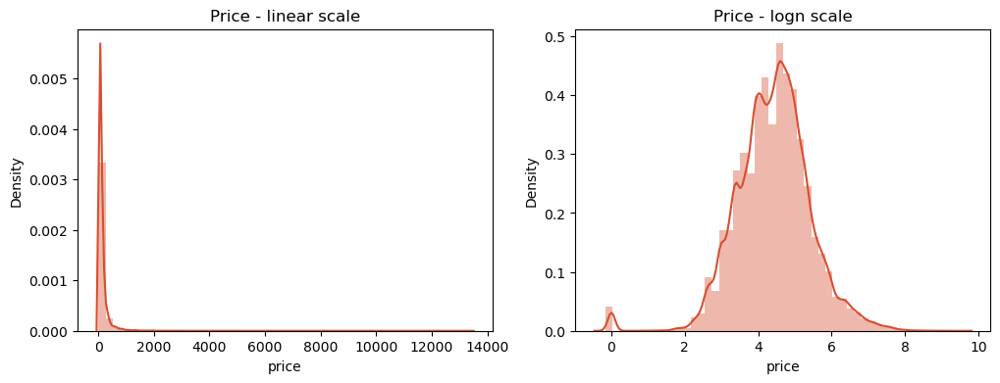

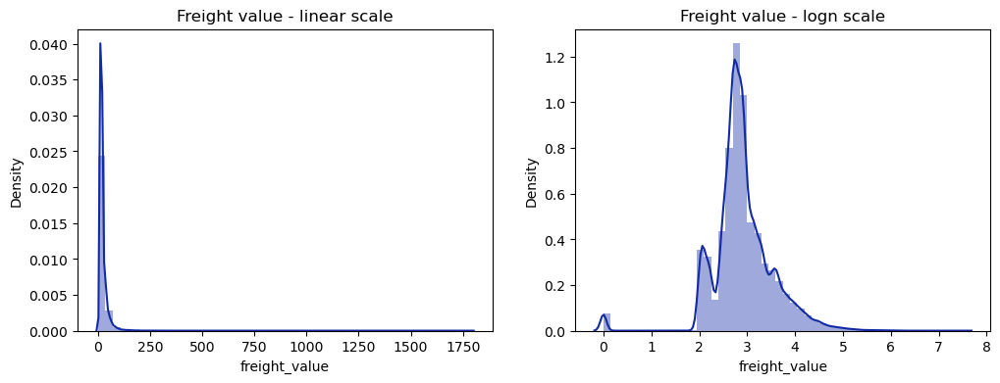

In [49]:
# Products value
sum_value = df_orders_items_products.groupby('order_id')['price'].sum()
plot_dist(sum_value, sum_value.apply(lambda x: np.log(x) if x > 0 else 0), 'Price')
# Freights value
sum_value = df_orders_items_products.groupby('order_id')['freight_value'].sum()
plot_dist(sum_value, sum_value.apply(lambda x: np.log(x) if x > 0 else 0), 'Freight value', color="#122aa5")

Product price and freight value exhibits same distribution pattern. As expected, both price and freight value plots are right skewed histogram - most of the times, people buy cheaply priced goods on olist

<h3>Q3.Timeseries</h3>
Let's view this dataset from time series perspective, how the business performs over time.

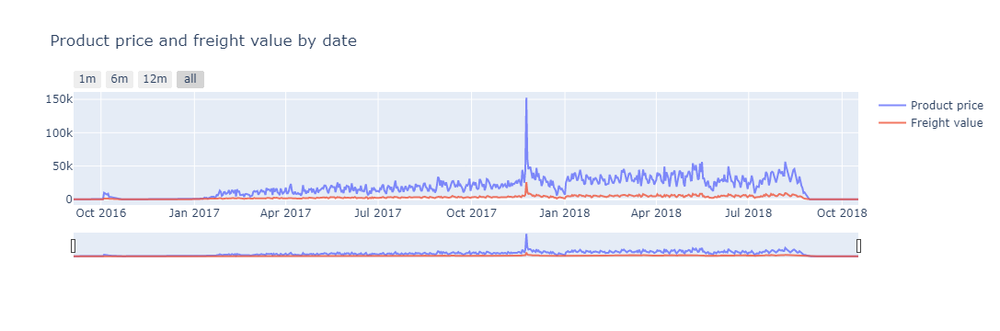

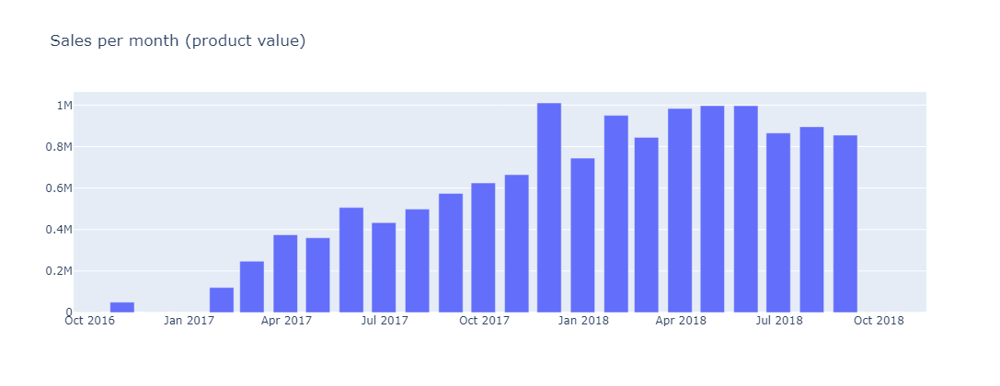

In [50]:
# Product value by date
df_orders_items_products['datetime'] =  pd.to_datetime(df_orders_items_products['order_purchase_timestamp'])
value_date = df_orders_items_products.groupby([df_orders_items_products['datetime'].dt.date])['price'].sum()
freight_date = df_orders_items_products.groupby([df_orders_items_products['datetime'].dt.date])['freight_value'].sum()
# Plot timeseries
trace0 = go.Scatter(x=value_date.index.astype(str), y=value_date.values, opacity = 0.8, name='Product price')
trace1 = go.Scatter(x=freight_date.index.astype(str), y=freight_date.values, opacity = 0.8, name='Freight value')
layout = dict(
    title= "Product price and freight value by date",
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1m', step='month', stepmode='backward'),
                dict(count=6, label='6m', step='month', stepmode='backward'),
                dict(count=12, label='12m', step='month', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible = True),
        type='date'
    )
)
fig = dict(data= [trace0, trace1], layout=layout)
iplot(fig)

# Sales for month
value_month = df_orders_items_products[['datetime', 'price']].copy()
value_month.set_index('datetime', inplace=True)
value_month = value_month.groupby(pd.Grouper(freq="M"))['price'].sum()
trace = go.Bar(x= value_month.index, y= value_month.values)
layout = go.Layout(title='Sales per month (product value)', height=420, width=800)
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

Key notes:
* There is a huge spike in Nov 24 due to Black Friday
* Sales are weak after Nov 30 (end-year holidays)
* In 2016, there are some sales in october, but almost nothing in the next two months
* There is a spike in products price in Jul 2018, but not in freight

<h3>Q3.1_Products, orders, sellers, customers</h3>
Pandas supports datetime indexes and makes it very simple to create plots, let's used the column `order_approved_at` as the index timestamp. To generate unique counts of orders, customers, products and sellers we can use the resample and nunique methods of a pandas dataframe with datetime index.

Not forgetting using column `order_purchase_timestamp` to prepare a csv file for our WebApp deomnstration.

In [51]:
# since approved orders are the one driving revenue, we will set this columns as the index and check # of days
osc_df = df_orders_items_products.set_index('order_approved_at')
osc_daily = osc_df[['order_id', 'product_id', 'seller_id', 'customer_unique_id']].resample(rule='D').nunique()
osc_daily.index  # 719 days

DatetimeIndex(['2016-09-15', '2016-09-16', '2016-09-17', '2016-09-18',
               '2016-09-19', '2016-09-20', '2016-09-21', '2016-09-22',
               '2016-09-23', '2016-09-24',
               ...
               '2018-08-25', '2018-08-26', '2018-08-27', '2018-08-28',
               '2018-08-29', '2018-08-30', '2018-08-31', '2018-09-01',
               '2018-09-02', '2018-09-03'],
              dtype='datetime64[ns]', name='order_approved_at', length=719, freq=None)

In [52]:
df_orders_items_products['order_purchase_timestamp'] =  pd.to_datetime(df_orders_items_products['order_purchase_timestamp'])
osc_pur_df = df_orders_items_products.set_index('order_purchase_timestamp')
osc_pur_daily = osc_pur_df.groupby(pd.Grouper(freq='D')).agg({'price': 'sum', 'freight_value': 'sum', 'order_id':'count', 'product_id':'count'})
osc_pur_daily.index

DatetimeIndex(['2016-09-04', '2016-09-05', '2016-09-06', '2016-09-07',
               '2016-09-08', '2016-09-09', '2016-09-10', '2016-09-11',
               '2016-09-12', '2016-09-13',
               ...
               '2018-10-08', '2018-10-09', '2018-10-10', '2018-10-11',
               '2018-10-12', '2018-10-13', '2018-10-14', '2018-10-15',
               '2018-10-16', '2018-10-17'],
              dtype='datetime64[ns]', name='order_purchase_timestamp', length=774, freq='D')

In [53]:
# check if any days with more than one order was placed
osc_daily[osc_daily['order_id'] > 1]

,order_id,product_id,seller_id,customer_unique_id
order_approved_at,,,,
2016-10-04,20,19,16,20
2016-10-05,11,14,8,11
2016-10-06,110,102,69,110
2016-10-07,59,58,47,58
2016-10-08,26,28,22,26
...,...,...,...,...
2018-08-25,81,85,75,81
2018-08-26,70,71,66,70
2018-08-27,64,64,59,64


<h3>Q3.2_Business Questions</h3>

We have seen simple time series of unique orders, sellers, and customers, thers are a few relevant business questions can be answered.
1. Which product categories contribute the most to total products purchased?
1. Which cities do most products being brought from?
1. Is there any seasonality to the number of orders placed?

<h4> Histograms </h4>

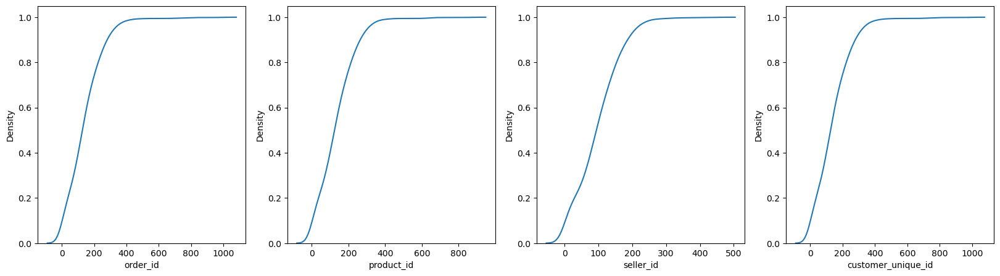

In [54]:
fig, axs = plt.subplots(1,4,figsize=(20,5))
for col, ax in zip(osc_daily.columns.tolist(),axs):
    sns.kdeplot(data=osc_daily, x=col, cumulative=True, ax=ax);

We observed that the unique counts of orders, products, sellers and customers have similar cumulative distribution function. All of them skew to the right and in the case of daily unique orders, it reached 90% at around 300 orders but reached 100% at over thousand orders.

<h4> Simple time series plot </h4>

Before digging deeper into the contribution of each category to orders, let's look at the time series for unique products and orders.

Text(0, 0.5, 'Count')

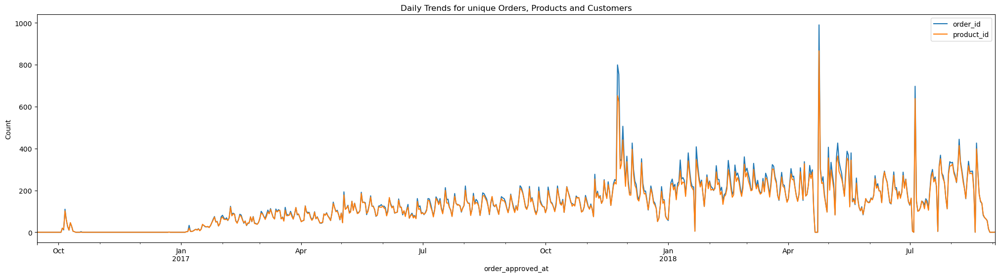

In [55]:
ax = osc_daily[['order_id', 'product_id']].plot(figsize=(25,6))
ax.set_title('Daily Trends for unique Orders, Products and Customers')
ax.set_ylabel('Count')

We observed that unique daily count of products IDs and order IDs follow same trends, this is a strong indication that the products dataset has been derived from products that has orders and it's not indicating product availability.

The orders between October 2016 and January 2017 are very little to almost zero, we'll be removing this interval from the dataset for our modelling.

It looks like there is steady gradual upwards trend in the first 3 quarters of 2017 follow with huge spike in November and December 2017. From the spike at the end of 2017 onwards, daily orders oscillate much more heavily and it's hard to tell if there is any trend at all. There are two additional huge spikes in the second and third querter of 2018.

In [56]:
# limit time span to be between Jan 2017 and Aug 2018
osc_df = osc_df[(osc_df.index >= '2017-01-01') & (osc_df.index < '2018-09-01')]
print(osc_df.index.min(), osc_df.index.max())

2017-01-05 12:10:17 2018-08-29 15:10:26


In [57]:
# limit time span to be between Jan 2017 and Aug 2018
osc_daily = osc_daily[(osc_daily.index >= '2017-01-01') & (osc_daily.index < '2018-09-01')]
print(osc_daily.index.min(), osc_daily.index.max())

2017-01-01 00:00:00 2018-08-31 00:00:00


<h4> Averages </h4>

It's hard to follow a trend with all the peaks and troughs, we shall do a rolling mean to smoothen the graphs and visualize a trend.

In [58]:
osc_rolling_mean = osc_daily.rolling(7).mean()
osc_rolling_mean_columns = [col + '_window_mean' for col in osc_rolling_mean.columns.tolist()]
osc_rolling_mean

,order_id,product_id,seller_id,customer_unique_id
order_approved_at,,,,
2017-01-01,NaN,NaN,NaN,NaN
2017-01-02,NaN,NaN,NaN,NaN
2017-01-03,NaN,NaN,NaN,NaN
2017-01-04,NaN,NaN,NaN,NaN
2017-01-05,NaN,NaN,NaN,NaN
...,...,...,...,...
2018-08-27,139.142857,139.285714,114.000000,139.000000
2018-08-28,105.428571,106.285714,89.000000,105.285714
2018-08-29,81.428571,82.857143,69.571429,81.428571


Since we will probably want to visualize daily counts and their rolling window means together, it's a good time to write a function that will calculate the following for a give numeric column:
1. the window mean, where the window value is a function argument,
1. join the results dataframes,
1. create the axes and plot the values

In [59]:
def resample_df(df, count_columns, aggregation_level, aggregation_function, set_index=False, **kwargs):
    '''
    returns a dataframe with daily unique counts
    df: dataframe with at least one datetime column to use a datetime index
    count_columns: list of columns to resample
    aggregation_level: the offset string or object representing target conversion, e.g. 'D' for day, 'M' for month
    aggregation_function: function to use passed as a string e.g. "sum', "count", "nunique"
    if set_index=True, pass a keyword argument dt_column=column to be set as the index
    '''
    if set_index and ('dt_column' in kwargs):
        try:
            df = df.set_index(kwargs['dt_column'])
        except 'TypeError':
            df[kwargs['dt_column']] = dfdf[kwargs['dt_column']].astype('datetime64')
            
    return df[count_columns].resample(rule=aggregation_level).agg(aggregation_function)

In [60]:
def get_ew_mean(df, column, span, join=True):
    '''
    returns a dataframe with column and the exponentially weighted mean applied to the column
    df: dataframe with numeric values, index should be of type datetime, daily level
    column: column to apply the exponentially weighted mean
    '''
    if join:
        suffix = "_" + str(span) + "ew_mean"
        return df[column].to_frame().join(df[column].ewm(span=span).mean().to_frame(name=column + suffix))
    else:
        return df[column].ewm(span=span).mean().to_frame(name=column + suffix)

In [61]:
def get_rolling_mean(df, column, window, join=True):
    '''
    returns a dataframe with column the moving average (rolling mean) applied to the column
    df: dataframe with numeric values, index should be of type datetime, daily level
    column: column to apply the moving average
    '''
    if join:
        suffix = "_" + str(window) + "units_mean"
        return df[column].to_frame().join(df[column].rolling(window).mean().to_frame(name=column + suffix))
    else:
        return df[column].to_frame().rolling(window).mean().to_frame(name=column + suffix)

In [62]:
def mean_fetcher(df, column, window, means, join=True):
    '''
    calls one or many functionas that calculate a specific mean, returns the result of the function
    df: dataframe with numeric values
    column: column in the dataframe on which to calculate the mean
    means: list of means to calculate, valid are "rolling" and "ew"
    '''
    
    means_dict = {
        'rolling': get_rolling_mean,
        'ew': get_ew_mean
    }
    
    result_dfs = [means_dict[mean](df, column, window, join) for mean in means if mean in means_dict]
    
    if len(result_dfs) == 1:
        return result_dfs[0]
    else:
        return result_dfs[0].join(result_dfs[1].drop(columns=[column]), lsuffix="_" + means[0], rsuffix="_" + means[1])

In [63]:
def plot_cols(df, columns, y_label, title, xlim=None, filename=None, **kwargs):
    '''
    returns a list of figures with time series plots
    df: dataframe with numeric values, index should be of type datetime, daily level
    columns: list of columns within df for which to plot the time series, strings
    title: plot title, string
    y_label: y axis label, string
    kwargs: used to calculate a mean based on a window e.g. {'means': ['rolling', 'ew'], 'window'=7}
        keys for kwargs: 'means' and 'window'
        keys' values:
            for 'means': a list of means to use, available are 'rolling' and 'ew' (exponentially weighted)
            for 'window': integer, interval for which to calculate the mean chosen
    '''
    
    fig, axs = plt.subplots(len(columns), 1, figsize=(25, 8 * len(columns)), sharex=False, constrained_layout=True)
    
    try:
        len(axs)
    except TypeError:
        axs = [axs]
    
    column_dfs = []
    for col in columns:
        if 'window' in kwargs:
            column_dfs.append(mean_fetcher(df, col, **kwargs, join=True ))
        else:
            column_dfs.append(df[col].to_frame(name=col))
    
    for df, ax in zip(column_dfs, axs):
        for col, style in zip(df.columns.tolist(), ['-', '-.', '--']):
            ax.plot(df.index, df[col], linestyle=style, label=col)
            labels = ax.get_xticklabels()
            plt.setp(labels, rotation=45, horizontalalignment='center')
            ax.set(ylabel=y_label)
            ax.legend(loc="upper left")
        if xlim:
            ax.set_xlim(*xlim)

    fig.suptitle(title)
    if filename:
        plt.savefig(filename)

In [64]:
orders_daily = osc_daily['order_id']
orders_daily.to_frame()

,order_id
order_approved_at,
2017-01-01,0
2017-01-02,0
2017-01-03,0
2017-01-04,0
2017-01-05,3
...,...
2018-08-27,64
2018-08-28,56
2018-08-29,15


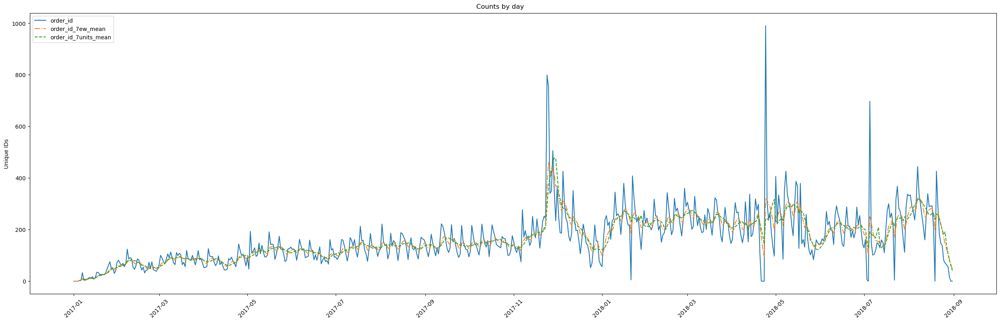

In [65]:
plot_cols(osc_daily, ['order_id'], "Unique IDs", "Counts by day", filename='assets/graphs_orders_daily_plot_7rm.png', window=7, means=['ew', 'rolling'])

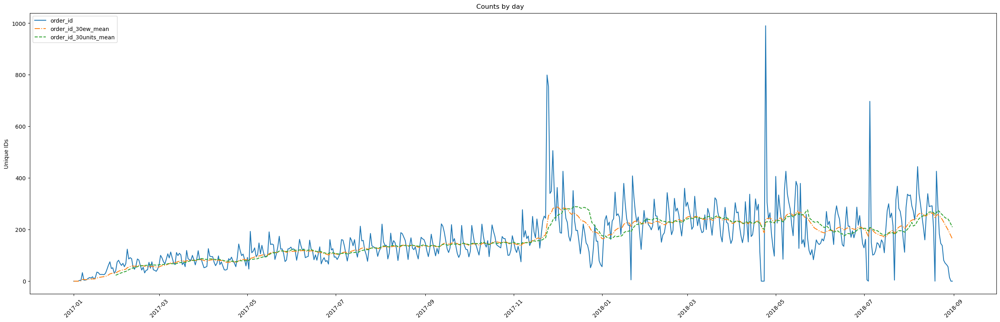

In [66]:
plot_cols(osc_daily, ['order_id'], "Unique IDs", "Counts by day", filename='assets/graphs_orders_daily_plot_30rm.png', window=30, means=['ew', 'rolling'])

The above graphs show the unique count of order IDs and two averages, the orange line is an exponentially weigthed average for 30 days span and the green line is 30 days simple moving average. Through these averaged, we can definitely better recognize the steady growth through 2017 but also no growth in the first two quarters of 2018 and then a dip in the middle of the 3rd quarter of 2018.

Having analyzed the basic trends and orders, let's refocus on our business questions.

<h4>Q3.2.1_Product Category Share from Total Sold Products </h4>

Check the share of each product category for full dataset and later on see the evolution over time. From the above, we know that an order can contain one or more items from the same product category, so we need to count the number of products sold per category.

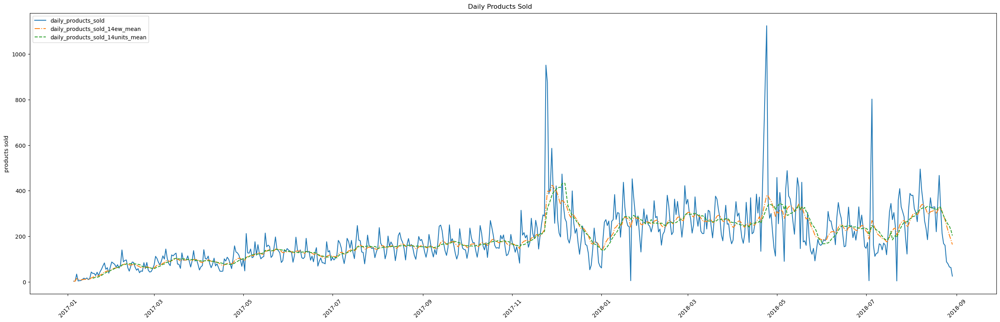

In [67]:
products_daily = osc_df.groupby(pd.to_datetime(osc_df.index.date))['product_id'].count().to_frame()
products_daily.columns = ['daily_products_sold']
plot_cols(products_daily, ['daily_products_sold'], 'products sold', 'Daily Products Sold', filename='assets/graphs_daily_products_sold_plot.png', window=14, means=['ew', 'rolling'])

In [68]:
products_daily.describe()

,daily_products_sold
count,597.000000
mean,188.046901
std,117.917989
min,3.000000
25%,108.000000
50%,165.000000
75%,247.000000
max,1124.000000


In [69]:
# products_daily.head(3)

In [70]:
product_cat_daily_df = osc_df.groupby([osc_df.index.date,'product_category_name'])['product_id'].count().reset_index(level=1)
product_cat_daily_df.index = pd.to_datetime(product_cat_daily_df.index)
# product_cat_daily_df.head(3)

In [71]:
def get_share_of_count(df, group_column, count_column, agg_function, new_column_name):
    '''
    group_column: column of df to group by
    count_coumn: column to count unique values
    agg_funtion: function to count values
    new_column_name: column name of the aggregation
    '''
    
    count_df = df.groupby(group_column)[count_column].agg(agg_function).sort_values(ascending=False).to_frame(name=new_column_name)
    count_df['share_from_total'] = count_df / count_df.sum()
    count_df['cumulative_share'] = count_df['share_from_total'].cumsum()
    return count_df

In [72]:
product_category_counts = get_share_of_count(product_cat_daily_df, 'product_category_name', 'product_id', 'sum', 'total_product_ids')
product_category_counts = product_category_counts.rename(columns={'total_product_ids': 'total_products_sold'})
dfi.export(product_category_counts[:10], 'assets/tables_top10_product_categories_products_table.png')
product_category_counts[:10]

,total_products_sold,share_from_total,cumulative_share
product_category_name,,,
bed_bath_table,11106,0.098928,0.098928
health_beauty,9619,0.085682,0.184609
sports_leisure,8620,0.076783,0.261393
furniture_decor,8262,0.073594,0.334987
computers_accessories,7806,0.069533,0.404520
housewares,6952,0.061925,0.466445
watches_gifts,5986,0.053321,0.519766
telephony,4532,0.040369,0.560135
garden_tools,4341,0.038668,0.598803


In [73]:
len(product_category_counts.index)

74

There are 74 categories for which a product was shipped as part of an order any given point in time. The top 10 categories make up 63% of the total products sold during the two years of data.

The top one category is `bed_bath_table`, followed by `health_beauty` and `sports_leisure`. Have these top categories always contributed the same share of products sold or has this changed over time?

In [74]:
top_categories = (product_category_counts[product_category_counts['cumulative_share'] <= 0.64]).index.tolist()
top_categories

['bed_bath_table',
 'health_beauty',
 'sports_leisure',
 'furniture_decor',
 'computers_accessories',
 'housewares',
 'watches_gifts',
 'telephony',
 'garden_tools',
 'auto']

In [75]:
products_weekly = product_cat_daily_df['product_id'].to_frame().resample(rule='W').sum()
products_weekly.columns = ['weekly_total_products']
dfi.export(products_weekly, "assets/tables_weekly_total_products_table.png")
products_weekly

,weekly_total_products
2017-01-08,44
2017-01-15,77
2017-01-22,229
2017-01-29,407
2017-02-05,510
...,...
2018-08-05,2349
2018-08-12,2288
2018-08-19,1855
2018-08-26,1494


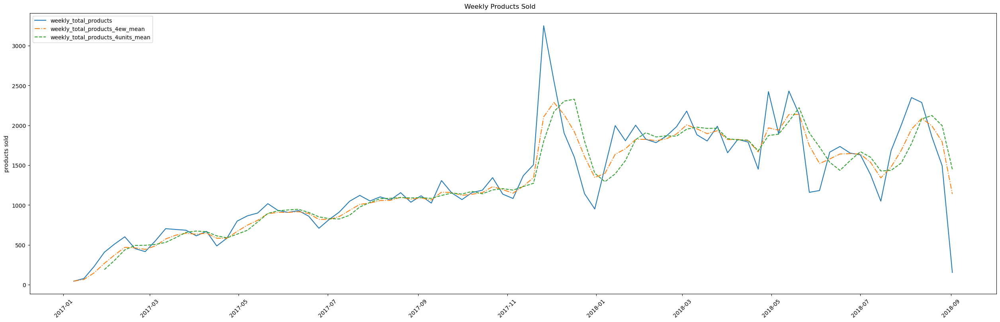

In [76]:
plot_cols(products_weekly, ['weekly_total_products'], "products sold", 'Weekly Products Sold', filename='assets/graphs_weekly_products_plot.png', window=4, means=['ew', 'rolling'])

In [77]:
products_monthly = product_cat_daily_df['product_id'].to_frame().resample(rule='M').sum()
products_monthly.columns = ['monthly_total_products']
# dfi.export(products_monthly, "assets/tables_monthly_total_products_table.png")
products_monthly

,monthly_total_products
2017-01-31,908
2017-02-28,1931
2017-03-31,3022
2017-04-30,2655
2017-05-31,4130
2017-06-30,3602
2017-07-31,4464
2017-08-31,4937
2017-09-30,4852
2017-10-31,5275


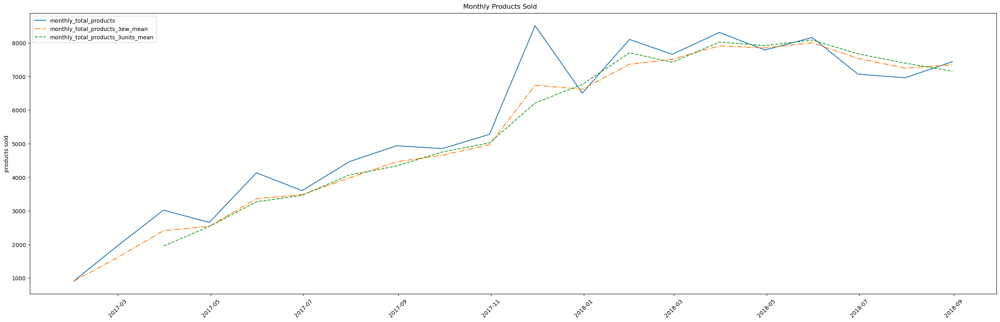

In [78]:
plot_cols(products_monthly, ['monthly_total_products'], "products sold", 'Monthly Products Sold', filename='assets/graphs_monthly_products_plot.png', window=3, means=['ew', 'rolling'])

From the above graph above, we can see an upwards trend in products sold until the middle of the second quarter of 2018 (around April), afterwards the growth seems to slow down and around June 2018 it looks like the number of monthly products sold starts to go down. With the absolute values for products sold plotted, we can now see the the monthly shares by category.

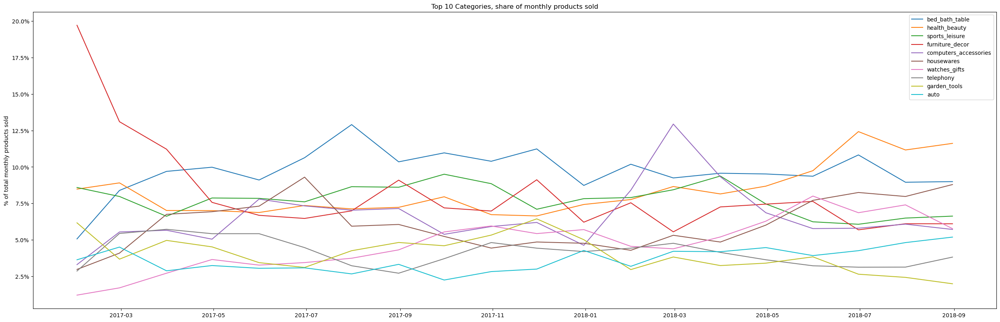

In [79]:
products_monthly_copy = products_monthly.copy(deep=True)
fig, ax = plt.subplots(1,1, figsize=(25,8), constrained_layout=True)
for cat in top_categories:
    cat_df = product_cat_daily_df[product_cat_daily_df['product_category_name']==cat]
    cat_monthly_df = resample_df(cat_df,['product_id'], aggregation_level='M', aggregation_function='sum')
    cat_count_column = f"{cat}_monthly_products"
    cat_monthly_df.columns = [cat_count_column]
    products_monthly_copy = products_monthly_copy.merge(cat_monthly_df, how='left', left_index=True, right_index=True)
    cat_monthly_share = (cat_monthly_df[cat_count_column] / products_monthly_copy['monthly_total_products']) * 100
    products_monthly_copy[f"{cat}_monthly_products_share"] = cat_monthly_share
    cat_monthly_share = pd.DataFrame(cat_monthly_share, columns=[f"{cat}_monthly_products_share"])
    ax.plot(cat_monthly_share.index, cat_monthly_share[f"{cat}_monthly_products_share"], label=cat)

ax.yaxis.set_major_formatter(mtick.PercentFormatter())
ax.set(ylabel='% of total monthly products sold', title='Top 10 Categories, share of monthly products sold')
plt.legend()
#     plot_cols(cat_monthly_share, cat_monthly_share.columns.to_list(), "% from total", f"Category = {cat} Monthly Share from Total Products Sold")

Almost all the top ten categories maintained same monthly share of products sold with some fluctuation, however we observed some odds such as huge drop for furniture_decor products on beginning of 2017 and spike for computer_accessories on March 2018.

In [80]:
products_monthly_copy = products_monthly.copy(deep=True)
for cat in top_categories:
    cat_df = product_cat_daily_df[product_cat_daily_df['product_category_name']==cat]
    cat_monthly_df = resample_df(cat_df,['product_id'], aggregation_level='M', aggregation_function='sum')
    cat_count_column = f"{cat}_monthly_products"
    cat_monthly_df.columns = [cat_count_column]
    products_monthly_copy = products_monthly_copy.merge(cat_monthly_df, how='left', left_index=True, right_index=True)
    cat_monthly_share = (cat_monthly_df[cat_count_column] / products_monthly_copy['monthly_total_products']) * 100
    products_monthly_copy[f"{cat}_monthly_products_share"] = cat_monthly_share
    cat_monthly_share = pd.DataFrame(cat_monthly_share, columns=[f"{cat}_monthly_products_share"])
    # plot_cols(cat_monthly_share, cat_monthly_share.columns.to_list(), "% from total", f"Category = {cat} Monthly Share from Total Products Sold")

It's a bit hard to follow the trends with 10 separate line plots, I'll try a single matplotlib ax in the form of a heatmap with the months as y labels, the categories as x labels, and the monthly share to total orders as the value.

In [81]:
products_monthly_copy.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20 entries, 2017-01-31 to 2018-08-31
Freq: M
Data columns (total 21 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   monthly_total_products                        20 non-null     int64  
 1   bed_bath_table_monthly_products               20 non-null     int64  
 2   bed_bath_table_monthly_products_share         20 non-null     float64
 3   health_beauty_monthly_products                20 non-null     int64  
 4   health_beauty_monthly_products_share          20 non-null     float64
 5   sports_leisure_monthly_products               20 non-null     int64  
 6   sports_leisure_monthly_products_share         20 non-null     float64
 7   furniture_decor_monthly_products              20 non-null     int64  
 8   furniture_decor_monthly_products_share        20 non-null     float64
 9   computers_accessories_monthly_products 

''

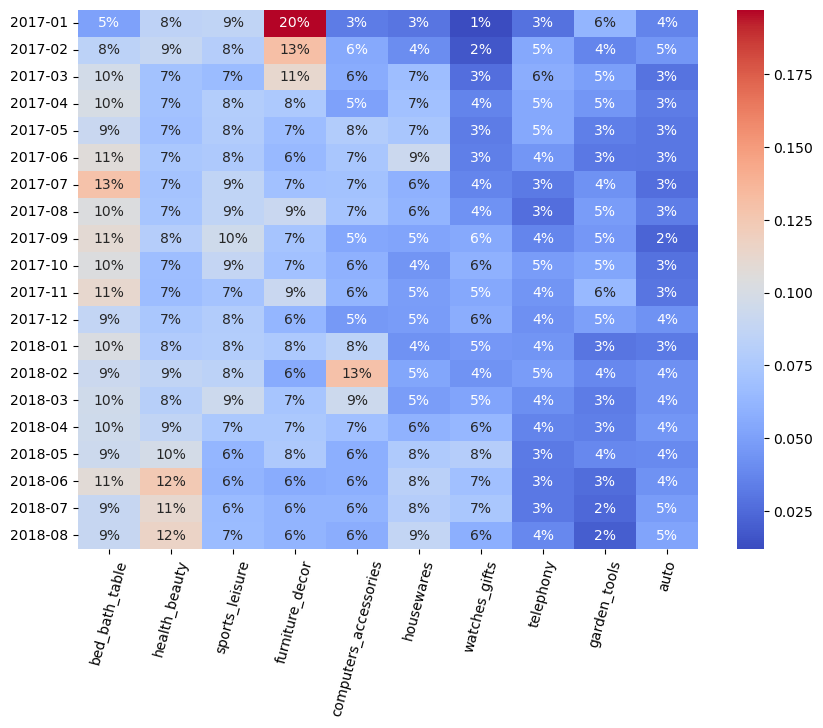

In [82]:
try:
    products_monthly_copy.index = products_monthly_copy.index.strftime('%Y-%m')
except AttributeError:
    pass
    
fig, ax = plt.subplots(figsize=(10, 7))
category_month_share_df = products_monthly_copy.drop(columns=['monthly_total_products']).filter(like='_share', axis=1)/100
category_month_share_df.columns = top_categories
ax = sns.heatmap(category_month_share_df, fmt='.0%', yticklabels=True, annot=True, ax=ax, cmap='coolwarm')
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=10, rotation=75)
plt.savefig("assets/tables_top10_categories_monthly_share_products_heatmap.png")
;

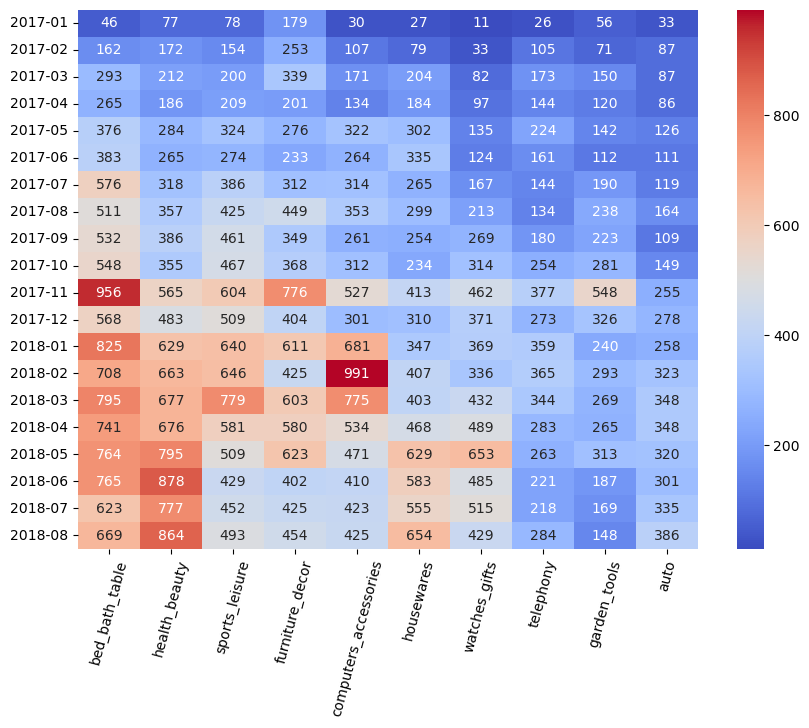

In [83]:
fig, ax = plt.subplots(figsize=(10, 7))
products_monthly_abs = products_monthly_copy.drop(columns=['monthly_total_products']).filter(regex='.*(?<!_share)$', axis=1)
products_monthly_abs.columns = top_categories
ax = sns.heatmap(products_monthly_abs, yticklabels=True, fmt='d', annot=True, ax=ax, cmap='coolwarm')
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=10, rotation=75)
plt.savefig("assets/tables_top10_categories_monthly_abs_products_heatmap.png")

From the heatmap we can see that the top category for the two years of data `bed_bath_table` consistently takes around 8% to 10% of monthly products sold. `health_beauty` has an upwards trend starting in the lower 7% and ending the last months of the series above 10% from total monthly sold products, overtaking bed_bath_table as the top category for these months. Lastly, we can see that the categories `housewares` and `watches_gifts` had an upwards trends for their share of total products sold towards the end of the series, while `sports_leisure` and `furniture_decor` had a downwards trend as time went on.

<h4>Q3.2.2_Customer City share from Total Products Sold </h4>

Let's use the same workflow as for product category to see where products sold are being bought from within Brazil.

In [84]:
customer_city_daily_df = osc_df.groupby([osc_df.index.date,'customer_city'])['product_id'].count().reset_index(level=1)
customer_city_daily_df.index = pd.to_datetime(customer_city_daily_df.index)
# customer_city_daily_df

In [85]:
customer_city_product_counts = get_share_of_count(customer_city_daily_df, 'customer_city', 'product_id', 'sum', 'total_product_ids')
customer_city_product_counts = customer_city_product_counts.rename(columns={'total_product_ids': 'total_products_sold'})
dfi.export(customer_city_product_counts[:10], 'assets/tables_top10_cities_products_table.png')
customer_city_product_counts[:10]

,total_products_sold,share_from_total,cumulative_share
customer_city,,,
sao paulo,17764,0.158234,0.158234
rio de janeiro,7797,0.069452,0.227687
belo horizonte,3129,0.027872,0.255558
brasilia,2384,0.021236,0.276794
curitiba,1739,0.015490,0.292284
campinas,1643,0.014635,0.306919
porto alegre,1605,0.014297,0.321216
salvador,1412,0.012577,0.333794
guarulhos,1328,0.011829,0.345623


In [86]:
top_cities = (customer_city_product_counts[customer_city_product_counts['cumulative_share'] <= 0.36]).index.tolist()
city_products_monthly_copy = products_monthly.copy(deep=True)
for city in top_cities:
    city_df = customer_city_daily_df[customer_city_daily_df['customer_city']==city]
    city_monthly_df = resample_df(city_df,['product_id'], aggregation_level='M', aggregation_function='sum')
    city_count_column = f"{city}_monthly_products"
    city_monthly_df.columns = [city_count_column]
    city_products_monthly_copy = city_products_monthly_copy.merge(city_monthly_df, how='left', left_index=True, right_index=True)
    city_monthly_share = (city_monthly_df[city_count_column] / city_products_monthly_copy['monthly_total_products'])
    city_products_monthly_copy[f"{city}_monthly_products_share"] = city_monthly_share
    city_monthly_share = pd.DataFrame(city_monthly_share, columns=[f"{city}_monthly_products_share"])
#     plot_cols(city_monthly_share, city_monthly_share.columns.to_list(), "% from total", f"City = {city} Monthly Share from Total Products Sold")

''

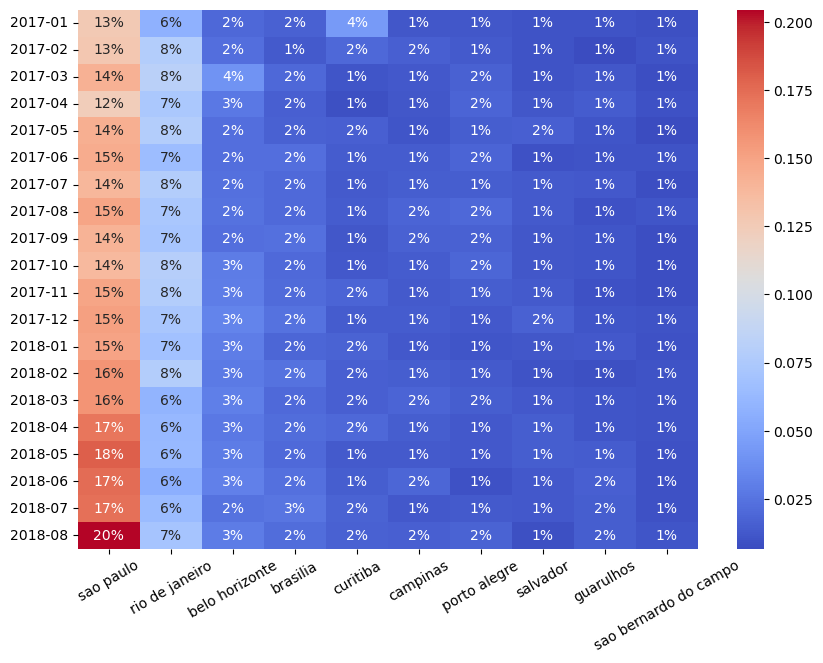

In [87]:
try:
    city_products_monthly_copy.index = city_products_monthly_copy.index.strftime('%Y-%m')
except AttributeError:
    pass
fig, ax = plt.subplots(figsize=(10, 7))
city_monthly_share_df = city_products_monthly_copy.drop(columns=['monthly_total_products']).filter(like='_share', axis=1)
city_monthly_share_df.columns = top_cities
ax = sns.heatmap(city_monthly_share_df, yticklabels=True, fmt='.0%', annot=True, ax=ax, cmap='coolwarm')
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=10, rotation=30)
plt.savefig("assets/graphs_top10_cities_monthly_share_products_heatmap.png")
;

In terms of the share from total monthly products sold per city, we can see that as the number of products sold increased (see figue 'Monthly Products Sold'), the share of Sao Paolo increased as well, meaning that most of the growth in products sold came from customers in Sao Paolo. Rio de Jairo has a more or less constant share of between 6% to 8%. All other cities, the long tail, seem to have a mothly share of 2% or less.

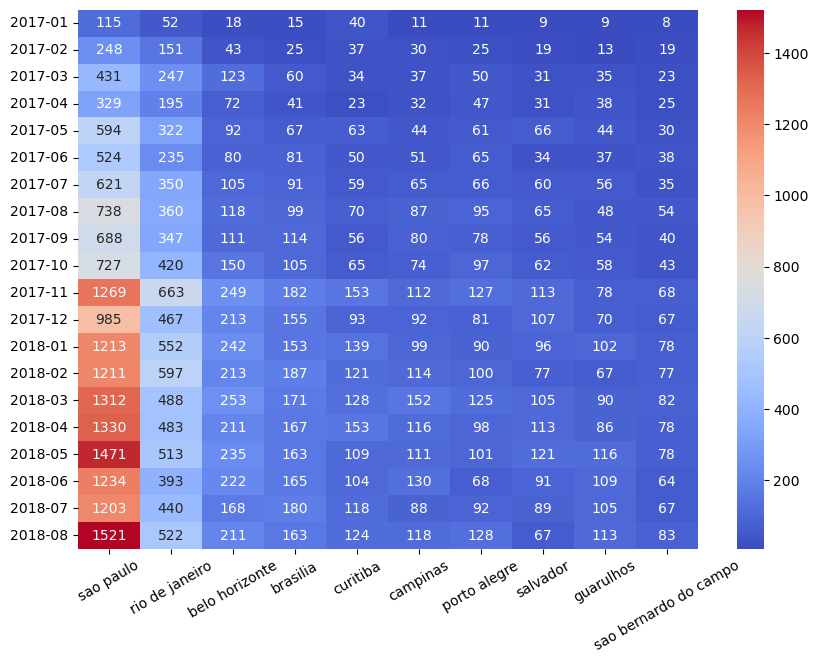

In [88]:
# top10 cities monthly abs product
fig, ax = plt.subplots(figsize=(10, 7))
city_products_abs_monthly = city_products_monthly_copy.drop(columns=['monthly_total_products']).filter(regex='.*(?<!_share)$', axis=1)
city_products_abs_monthly.columns = top_cities
ax = sns.heatmap(city_products_abs_monthly, yticklabels=True, fmt='d', annot=True, ax=ax, cmap='coolwarm')
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=10, rotation=30)
plt.savefig("assets/graphs_top10_cities_monthly_abs_products_heatmap.png")

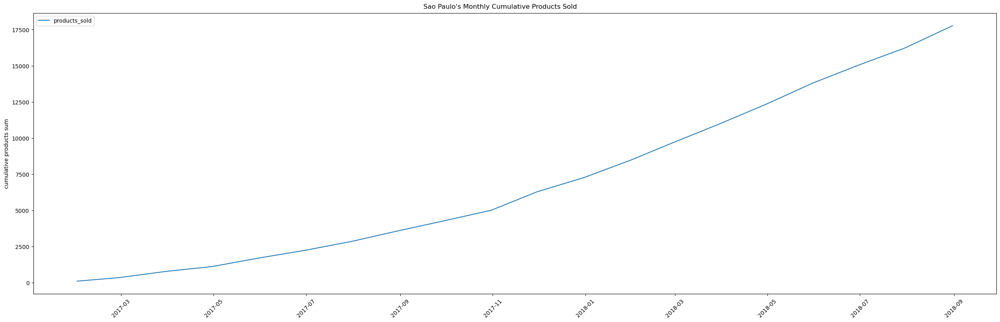

In [89]:
# extract 'Sao Paolo' city monthly cumulative products sold
sao_paolo_df = customer_city_daily_df[customer_city_daily_df['customer_city'] == 'sao paulo'].drop(columns=['customer_city'])
sao_paolo_df.columns = ['products_sold']
sao_paolo_df = resample_df(sao_paolo_df, ['products_sold'], 'M', 'sum')
plot_cols(sao_paolo_df.cumsum(), ['products_sold'], y_label= 'cumulative products sum', title="Sao Paulo's Monthly Cumulative Products Sold")

<AxesSubplot:>

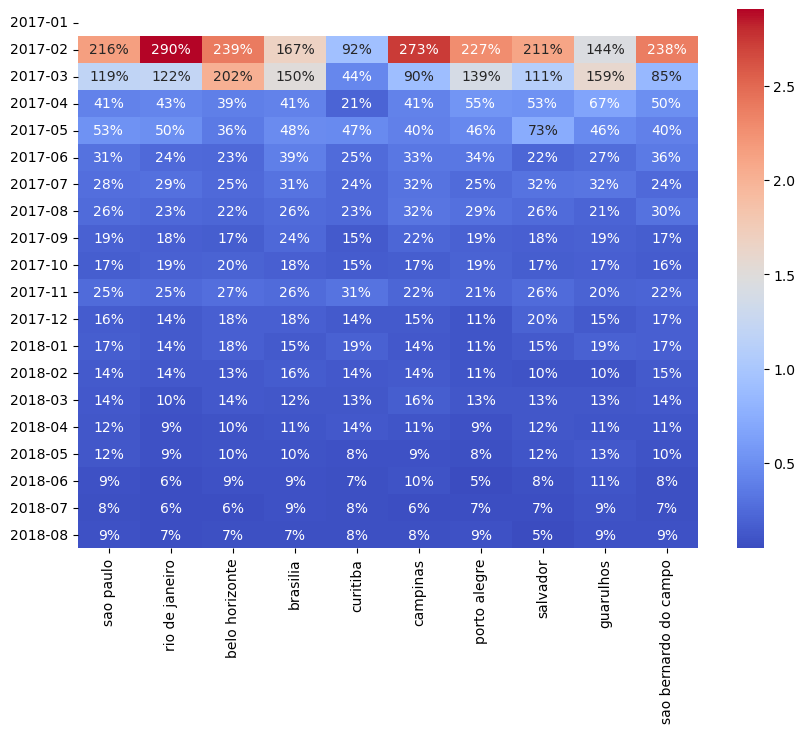

In [90]:
# percentage change of the cumulutave sum of monthly products sold
fig, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(city_products_abs_monthly.cumsum().pct_change(), yticklabels=True, fmt='.0%', annot=True, cmap='coolwarm')

From the above heatmap we can see that all cities seem to have a similar percentage change to their cumulative monthly products sold. This means that in overall, their cumulative plots have a similar shape even though the absolutes might be of different magnitudes.

In [91]:
# create dataframe of customer city monthly 
customer_city_monthly_df = osc_df.groupby([osc_df.index.year, osc_df.index.month, 'customer_city'])['product_id'].count()
customer_city_monthly_df.index = customer_city_monthly_df.index.set_names(['year', 'month', 'customer_city'])
monthly_totals = customer_city_monthly_df.groupby(level=[0,1]).sum()
pcts = customer_city_monthly_df / monthly_totals
customer_city_monthly_df = customer_city_monthly_df.to_frame()
customer_city_monthly_df['monthly_share'] = pcts
customer_city_monthly_df.head(3)
# customer_city_monthly_df = customer_city_monthly_df.reset_index()

product_id  monthly_share
year month customer_city                           
2017 1     agua boa                1       0.001101
           alpinopolis             1       0.001101
           alvinopolis             1       0.001101

In [92]:
len(customer_city_monthly_df.index.unique(level=2)) # number of cities with at least one product purchased

4116

In [93]:
# dfi.export(customer_city_monthly_df['product_id'].describe().to_frame(name='monthly_products_sold'), 'assets/tables_city_product_count_summary_statistics_table.png')
customer_city_monthly_df['product_id'].describe().to_frame(name='monthly_products_sold')

,monthly_products_sold
count,21284.000000
mean,5.274572
std,34.317937
min,0.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,1521.000000


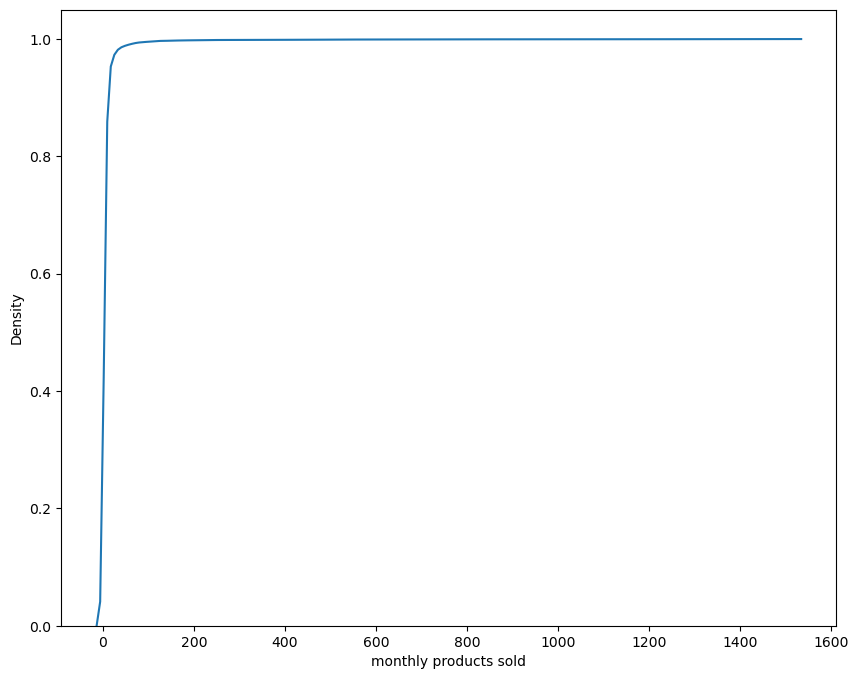

In [94]:
# plot graphs of cdf for city products count
fig, ax = plt.subplots(1,1, figsize=(10, 8))
sns.kdeplot(data=customer_city_monthly_df, x='product_id', cumulative=True, ax=ax)
ax.set(xlabel='monthly products sold')
plt.savefig("assets/graphs_city_products_count_cdf.png")

From the summary statistics above, we can see that the median monthly purchased products per city is 1, which means that most cities have very few monthly purchased items. That shows that Olist has only significant demand in Sao Paolo and Rio de Janeiro. Neverthless, these two cities have never been accumulated more than 30% of total products purchased in a month, meaning that for Olist the longtail of smaller cities still represents the higher proportion of products purchased.

<h4>Q3.2.3_Seasonality </h4>

Let's now answer the last question: are there any days or months in which more orders are placed? Let's start by having a look again at the daily orders graph and the simple moving average and exponentially weighted average.

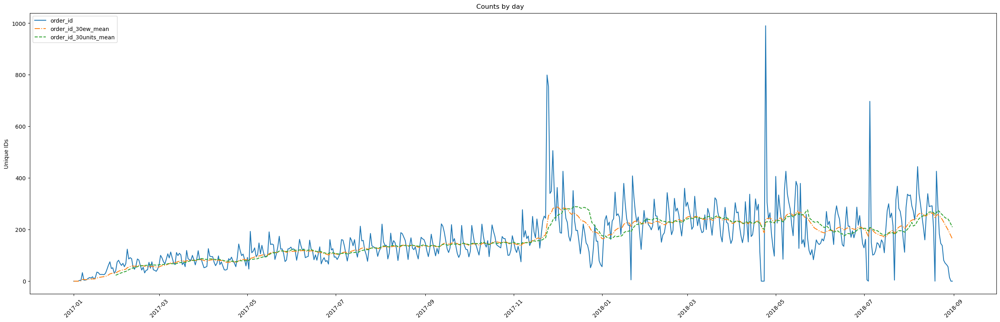

In [95]:
plot_cols(osc_daily, ['order_id'], "Unique IDs" , "Counts by day", window=30, means=['ew', 'rolling'])

<h5>Dickey-Fuller Test </h5>

The Dickey-Fuller allows us to check whether the time series is stationary or not. Briefly explained, a time series is stationary if it's probability distribution does not change over time. When a time series trends upwards or downwards, it is not stationary. When a time series is not stationary, lagged values of the time series can provide relevant information in predicting future change of the series. The null hypothesis for the Dickey-Fuller test is that the time series is not stationary, when the test returns a p-value above 5%, we have failed to reject the null hypothesis with statistical significance, and we can assume that the time series has a trend.

From the above graph, it seems like the number of orders placed is not stationry until around November 2017 with an upwards trend but it's hard to know if there is any trend at all afterwards, let's check the p-values of the Dickey-Fuller test for these two ranges.

In [96]:
results = smtsa.adfuller(orders_daily[:'2017-12-01'])
results[1]

0.9825588865810434

In [97]:
results = smtsa.adfuller(orders_daily['2017-12-01':])
results[1]

0.006194993380542683

In [98]:
ranges = [['2017-01-01', '2017-12-01'], ['2017-12-01', '2018-10-01']]
pvalues = [
    smtsa.adfuller(orders_daily[rnge[0]:rnge[1]])[1]
    for rnge in ranges
]
pval_col = {'pvalues': pvalues}
index = pd.MultiIndex.from_arrays(ranges, names=('start', 'end'))
dfuller_pvals_df = pd.DataFrame(data=pval_col, index=index)
dfi.export(dfuller_pvals_df, "assets/tables_dfuller_pvals_table.png")
dfuller_pvals_df

,,pvalues
start,end,
2017-01-01,2017-12-01,0.982559
2017-12-01,2018-10-01,0.006195


Until December 2017, according to the Dickey-Fuller test, the times series is not stationary and it clearly has a trend upwards. The p-value is 98% for this time range. The rest of the time series seems to be stationary, the test confirming the null hypothesis with a very low p-value. Let's plot p-values for the interval ranges of 3 months to see how consistent the above results are.

2017-01-01 00:00:00 2017-03-31 00:00:00
2017-04-01 00:00:00 2017-06-29 00:00:00
2017-06-30 00:00:00 2017-09-27 00:00:00
2017-09-28 00:00:00 2017-12-26 00:00:00
2017-12-27 00:00:00 2018-03-26 00:00:00
2018-03-27 00:00:00 2018-06-24 00:00:00
2018-06-25 00:00:00 2018-08-31 00:00:00


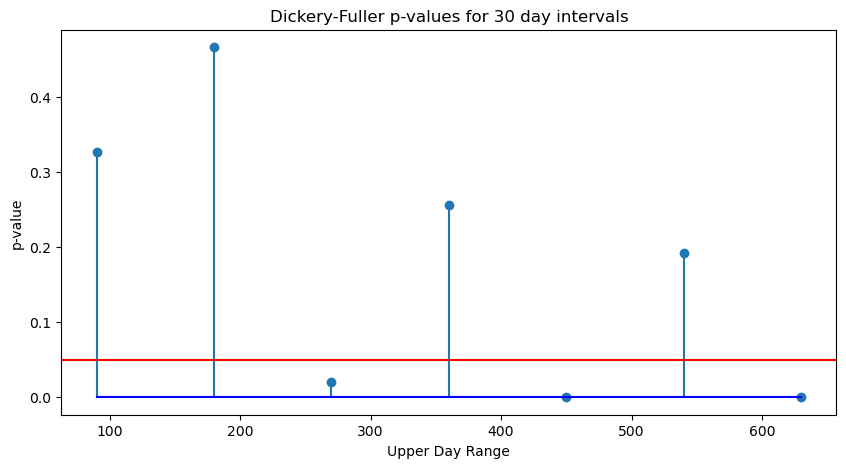

In [99]:
pvals = []
day_ranges = []
step = 90
for i in range(0,len(orders_daily + 1), step):
    print(orders_daily[i:i + step].index.min(), orders_daily[i:i + step].index.max())
    results = smtsa.adfuller(orders_daily[i:i + step])
    pvals.append(results[1])
    day_ranges.append(i + step)
#     day_ranges.append(f"{i} : {i + step}")
    

fig, ax = plt.subplots(1,1, figsize=(10, 5))    
ax.stem(day_ranges, pvals, basefmt='b', use_line_collection=True)
ax.axhline(y=0.05, color='r')
ax.set(xlabel='Upper Day Range', ylabel='p-value', title='Dickery-Fuller p-values for 30 day intervals');

<h5>Autocorelation </h5>

In time series analysis, it's important to understand whether a value of your series is related to previous values of the same series. To do so, we use an interval value called a lag, to create a shifted time series that is then compared to the original. The autocorrelation is the correlation of a time series with itself at a range of lag times. This test also allows us to get an idea of whether there is seasonality in a time series since. In a time series with weekly seasonality, we expect higher correlations for 7 day lags. Below I will be plotting the correlation values of the times series lagged by different values, from 0 to 50 days.

''

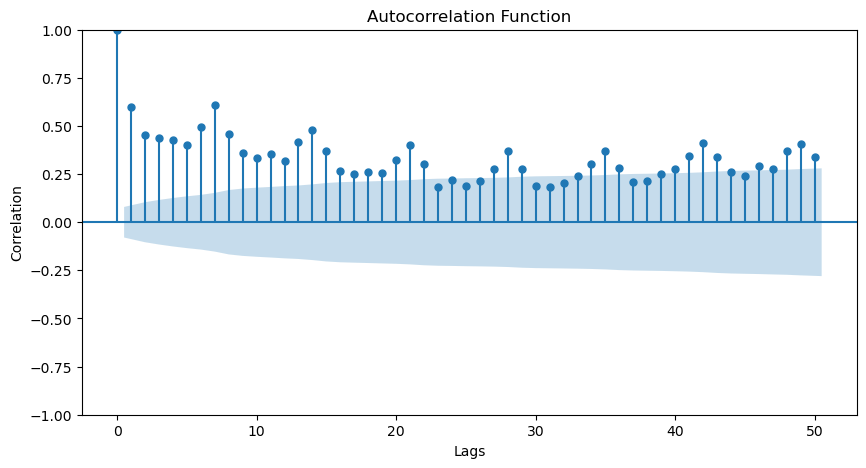

In [100]:
orders_daily = osc_daily['order_id']
fig, ax = plt.subplots(1,1, figsize=(10,5))
plot_acf(orders_daily, ax=ax, fft=True, lags=50)
ax.set(xlabel='Lags', ylabel='Correlation', title='Autocorrelation Function')
# plt.savefig("assets/graphs_daily_orders_autocorrelation_plot.png")
;

The blue shaded area represents the confidence interval. For values outside of the blue area, the correlation has a statistical significance of less than 5% i.e. it's not a fluke. As expected, we can see that beyond a lag of zero days which yields 100% correlation as expected, a lag of 7 days has the highest correlation at 60%. As we increase the lag value, the correlation decreases but we can see that multiples of 7 show as peaks. This means that for example two Tuesdays separated by a 2 week period are still correlated but less than two Tuesdays separated by a one week period.

<h5>Weekday time series </h5>

Having provided some time series related statistics, let's plot the evolution of daily orders over time of each day of the week to find if one day is consistently higher than the others.

In [101]:
orders_daily_df = orders_daily.to_frame()
orders_daily_df['weekday_name'] = orders_daily_df.index.day_name()
orders_daily_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 608 entries, 2017-01-01 to 2018-08-31
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   order_id      608 non-null    int64 
 1   weekday_name  608 non-null    object
dtypes: int64(1), object(1)
memory usage: 30.4+ KB


''

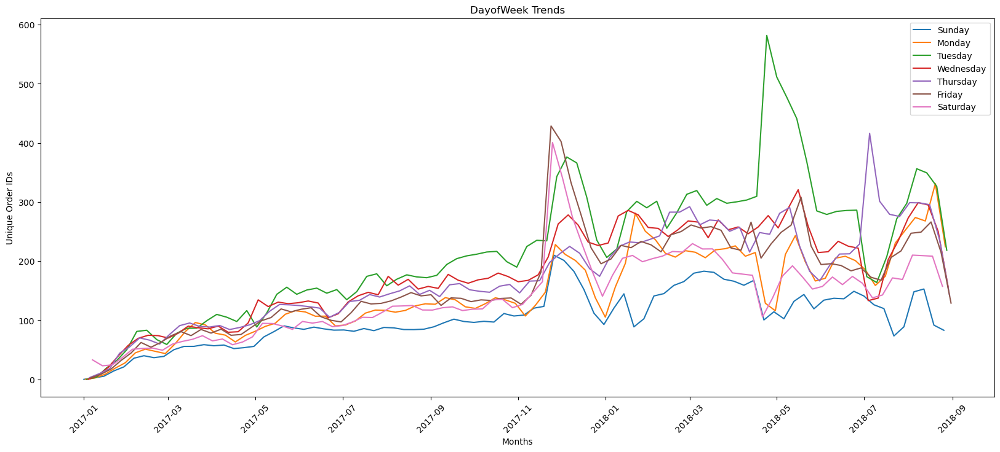

In [103]:
weekdays = orders_daily_df['weekday_name'].unique()
fig, ax = plt.subplots(1,1, figsize=(20,8))
for day in weekdays:
# print(day)
    day_df = orders_daily_df[orders_daily_df['weekday_name'] == day]
    ax.plot(day_df.index, day_df['order_id'].ewm(span=4).mean(), label=day)
labels = ax.get_xticklabels()
plt.setp(labels, rotation=45, horizontalalignment='center')
ax.set(xlabel='Months', ylabel='Unique Order IDs', title='DayofWeek Trends')
plt.legend()
plt.savefig("assets/graphs_dayofweek_orders_plot.png")
;

In the above graph, an exponentially weighted average of 4 units is used i.e. for each weekday, we have a separate line, and each of them takes the past 4 days of the same kind to calculate an average. The exponentially weighted average places more weight on days closer to the day for which the average is being calculated. We can see that that there is in fact a daily seasonality, high number of customers orders are consistently being approved on Tuesday than any other day of the week. It also seems that Wednesday is the second day where most orders are approved.

<h3>Q4.Product category</h3>

There are 74 unique categories with names translated to english from portuguese.

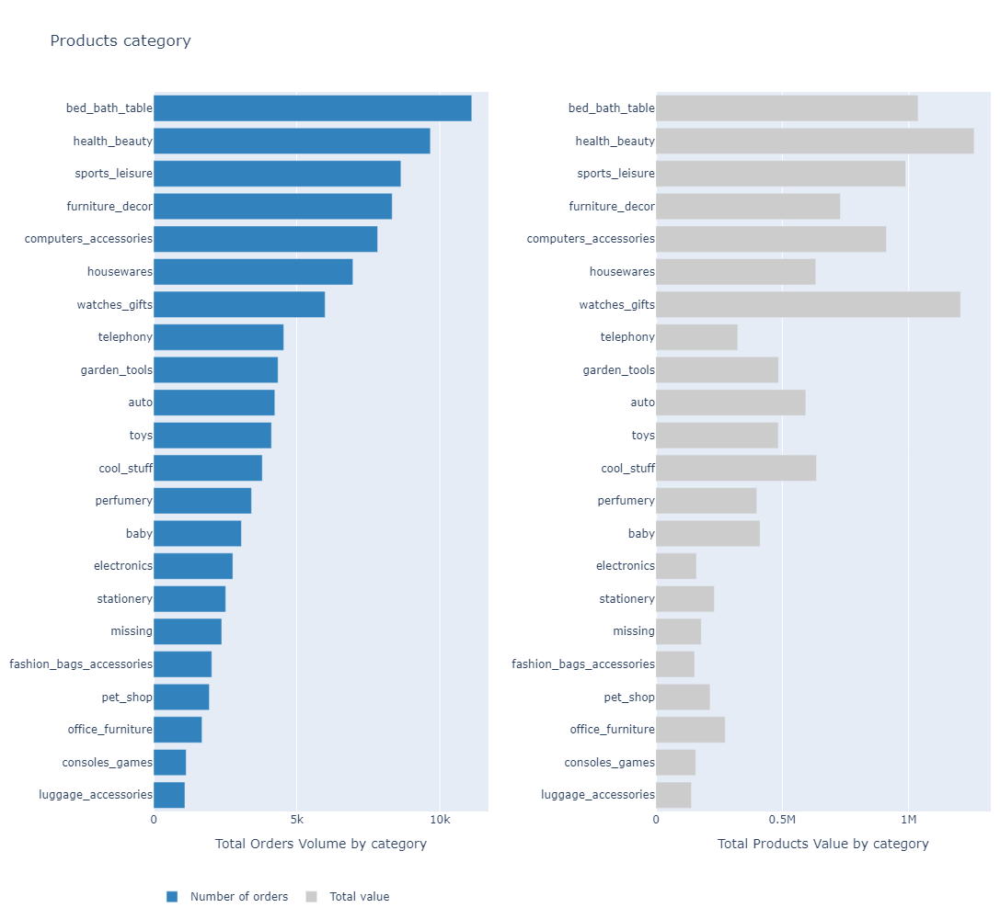

In [104]:
# Orders by category (less 1000 orders grouped into others)
orders_count = df_orders_items_products.groupby('product_category_name').size()
# orders_count['others'] = orders_count[orders_count < 1000].sum()
orders_count = orders_count[orders_count >= 1000].sort_values(ascending=True)
orders_value = df_orders_items_products.groupby('product_category_name')['price'].sum()
orders_value = orders_value[orders_count.index]
# translation = pd.Series(df_orders_items_products.product_category_name.values, index=df_orders_items_products.product_category_name)

trace0 = go.Bar(
    y=orders_count.index,
    x=orders_count.values,
    name='Number of orders',
    orientation='h',
    marker=dict(color='rgb(49,130,189)')
)
trace1 = go.Bar(
    y=orders_value.index,
    x=orders_value.values,
    name='Total value',
    orientation='h',
    marker=dict(color='rgb(204,204,204)')
)
fig = tools.make_subplots(rows=1, cols=2, print_grid=False)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig['layout'].update(
    height=1000,
    width=800,
    title='Products category',
    margin=dict(l=150, r=10, t=100, b=100),
    legend=dict(orientation="h")
)
fig['layout']['xaxis1'].update(title='Total Orders Volume by category', domain=[0, 0.40])
fig['layout']['xaxis2'].update(title='Total Products Value by category', domain=[0.6, 1])
iplot(fig)

Key notes:
- Top five most popular product categories by the count number of orders : bed_bath_table, health_beauty, sports_leisure, furniture_decor, computer_accessories
- Top five most popular product categories by the product total price : health_beauty, watches_gifts, bed_bath_table, sports_leisure, computer_accessories
- By doing calculation, watches_gifts category has the highest value per order - R$201.

<h5>Product name and description</h5>

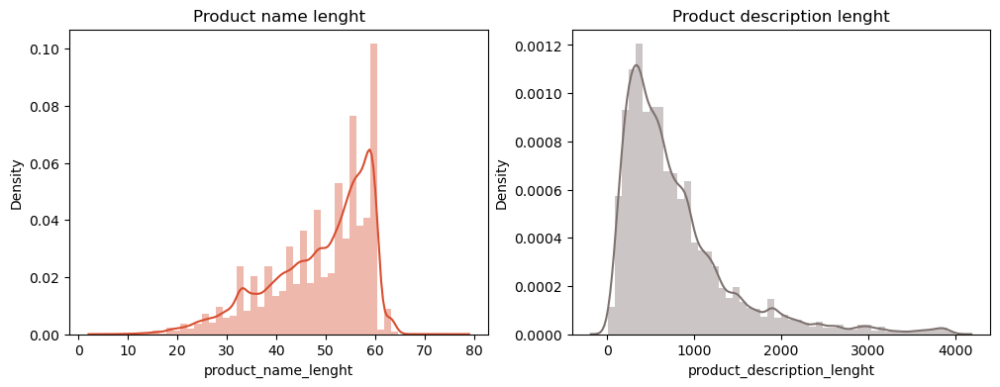

In [106]:
#product_name_lenght, product_description_lenght, product_photos_qty
fig, axis = plt.subplots(1, 2, figsize=(12,4))
axis[0].set_title("Product name lenght")
axis[1].set_title("Product description lenght")
ax1 = sns.distplot(df_orders_items_products['product_name_lenght'], color="#D84E30", ax=axis[0]) #rgba(204,204,204,1)', 'rgba(222,45,38,0.8)'
ax2 = sns.distplot(df_orders_items_products['product_description_lenght'], color="#7E7270", ax=axis[1]) #"#D84E30"

<h5>Number of photos</h5>

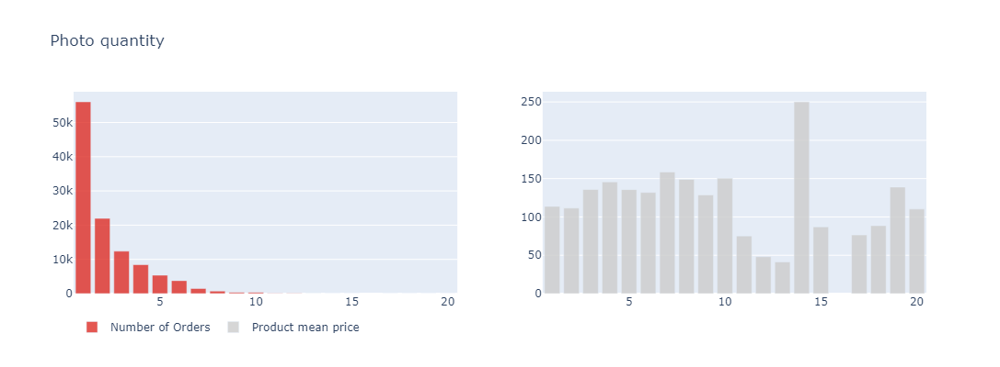

In [107]:
photo_qty = df_orders_items_products.groupby('product_photos_qty').size()
photo_value = df_orders_items_products.groupby('product_photos_qty')['price'].mean()
trace0 = go.Bar(
    x=photo_qty.index,
    y=photo_qty.values,
    name='Number of Orders',
    marker=dict(color='rgba(222,45,38,0.8)')
)
trace1 = go.Bar(
    x=photo_value.index,
    y=photo_value.values,
    name='Product mean price',
    marker=dict(color='rgba(204,204,204, 0.8)')
)
fig = tools.make_subplots(rows=1, cols=2, print_grid=False)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig['layout'].update(height=400, width=800, title='Photo quantity',
                     legend=dict(orientation="h"))
#fig['layout']['xaxis1'].update(title='photo quantity', domain=[0, 0.40])
#fig['layout']['xaxis2'].update(title='photo quantity', domain=[0.6, 1])
iplot(fig)

<h3>Q5.Review score</h3>
How is the review given by customers?

In [108]:
# Grouping data
df_orders_items_prod_re = df_orders_items_products.merge(order_reviews_df, how='outer', on='order_id')
print(df_orders_items_prod_re.shape)
# df_orders_items_prod_re.head(3)

(114092, 53)


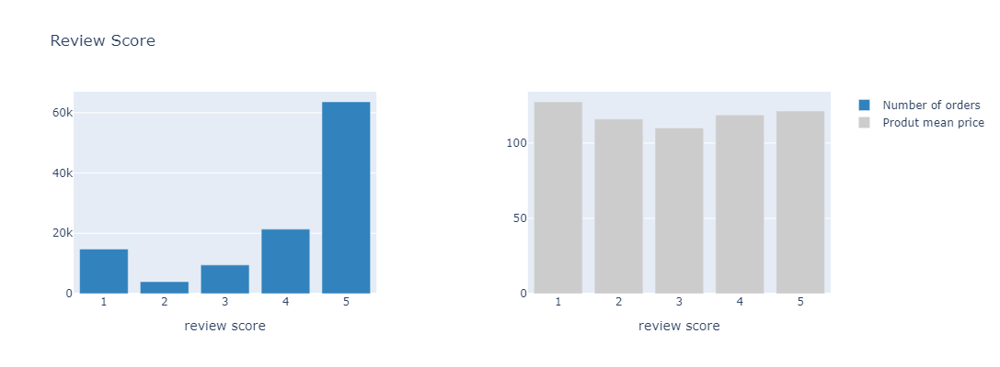

In [109]:
review_qty = df_orders_items_prod_re.groupby('review_score').size()
review_value = df_orders_items_prod_re.groupby('review_score')['price'].mean()
trace0 = go.Bar(
    x=review_qty.index,
    y=review_qty.values,
    name='Number of orders',
    marker=dict(color='rgb(49,130,189)')
)
trace1 = go.Bar(
    x=review_value.index,
    y=review_value.values,
    name='Produt mean price',
    marker=dict(color='rgb(204,204,204)')
)
fig = tools.make_subplots(rows=1, cols=2, print_grid=False)
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 1, 2)

fig['layout'].update(height=400, width=800, title='Review Score')
fig['layout']['xaxis1'].update(title='review score', domain=[0, 0.40])
fig['layout']['xaxis2'].update(title='review score', domain=[0.6, 1])
iplot(fig)

Scores are usually good (value of 4/5) and the bad (value of 1) ones seems to be related to slightly on more expensive products (or considerable orders).

<h4> Average review score for each categories </h4>

In [110]:
# Grouping data
df_product_aggreg = df_orders_items_prod_re.groupby(by=['product_category_name'], as_index=False).agg({'price': 'sum', 'freight_value': 'sum', 'order_id':'count', 'review_score':'sum'})
# df_product_aggreg = df_product_aggreg.agg({'price': 'sum', 'freight_value': 'sum', 'order_id':'count', 'review_score':'sum'})

# rename the columns
df_product_aggreg.columns = ['product_cat', 'sales', 'freight_sum', 'sales_qty', 'review_score_sum']
df_product_aggreg.reset_index(drop=True, inplace=True)

# Adding new columns for analysis
df_product_aggreg['avg_price'] = df_product_aggreg['sales'] / df_product_aggreg['sales_qty']
df_product_aggreg['avg_freight'] = df_product_aggreg['freight_sum'] / df_product_aggreg['sales_qty']
df_product_aggreg['avg_review_score'] = df_product_aggreg['review_score_sum'] / df_product_aggreg['sales_qty']

print(df_product_aggreg.shape)
df_product_aggreg.head()

(74, 8)


,product_cat,sales,freight_sum,sales_qty,review_score_sum,avg_price,avg_freight,avg_review_score
0,agro_industry_and_commerce,72530.47,5843.60,212,848.0,342.124858,27.564151,4.000000
1,air_conditioning,55024.96,6749.23,297,1159.0,185.269226,22.724680,3.902357
2,art,24202.64,4045.17,209,815.0,115.802105,19.354880,3.899522
3,arts_and_craftmanship,1814.01,370.13,24,99.0,75.583750,15.422083,4.125000
4,audio,50738.40,5724.54,365,1381.0,139.009315,15.683671,3.783562


In [111]:
df_product_aggreg = df_product_aggreg.sort_values(by=['sales'], ascending=False)
df_product_aggreg.head(3)

,product_cat,sales,freight_sum,sales_qty,review_score_sum,avg_price,avg_freight,avg_review_score
43,health_beauty,1263138.54,183483.54,9727,39957.0,129.859005,18.863323,4.107844
73,watches_gifts,1206075.33,100686.07,6001,23914.0,200.979058,16.778215,3.985002
7,bed_bath_table,1050936.61,207252.90,11270,43386.0,93.250808,18.389787,3.849689


In [112]:
df_product_aggreg = df_product_aggreg.sort_values(by=['sales_qty'], ascending=False)
df_product_aggreg.head(3)

,product_cat,sales,freight_sum,sales_qty,review_score_sum,avg_price,avg_freight,avg_review_score
7,bed_bath_table,1050936.61,207252.90,11270,43386.0,93.250808,18.389787,3.849689
43,health_beauty,1263138.54,183483.54,9727,39957.0,129.859005,18.863323,4.107844
68,sports_leisure,993656.51,169673.47,8700,35493.0,114.213392,19.502698,4.079655


In [113]:
df_product_aggreg = df_product_aggreg.sort_values(by=['avg_review_score'], ascending=False)
df_product_aggreg.head(3)

,product_cat,sales,freight_sum,sales_qty,review_score_sum,avg_price,avg_freight,avg_review_score
11,cds_dvds_musicals,730.00,224.99,14,65.0,52.142857,16.070714,4.642857
29,fashion_childrens_clothes,569.85,95.51,8,36.0,71.231250,11.938750,4.500000
8,books_general_interest,46856.88,9195.52,553,2441.0,84.732152,16.628427,4.414105


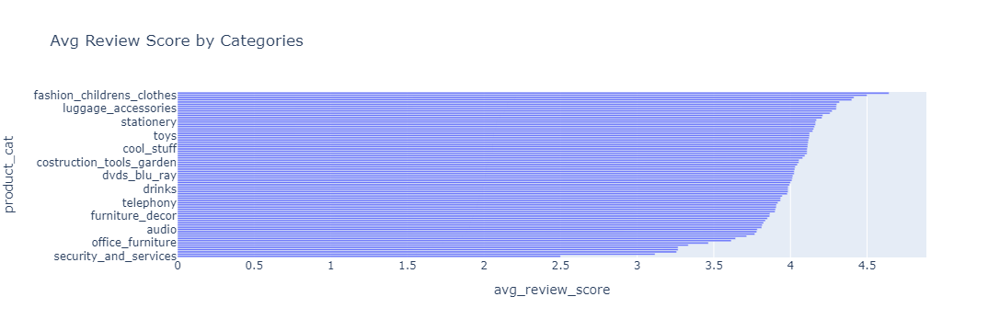

In [114]:
# Plotting selling product categories quantity data
fig1 = px.bar(df_product_aggreg, x="avg_review_score", y="product_cat", orientation='h', barmode="group", title='Avg Review Score by Categories')
fig1.update_layout(yaxis={'categoryorder':'total ascending'})
iplot(fig1)

`Fashion_childrens_clothes` has the highest average score of 4.64 among all product categories.

<h4>Q6.Average price by categories </h4> 

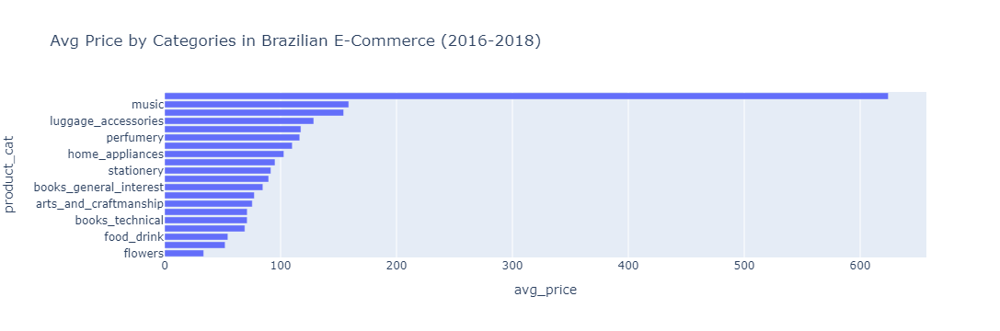

In [115]:
# Plotting selling product categories quantity data
fig2 = px.bar(df_product_aggreg.head(20), x="avg_price", y="product_cat", orientation='h', barmode="group", title='Avg Price by Categories in Brazilian E-Commerce (2016-2018)')
fig2.update_layout(yaxis={'categoryorder':'total ascending'})
iplot(fig2)

We observed low variation in the score. Majority of the scores are between 3.5 to 5. The product category with lowest score is `security_and_services`

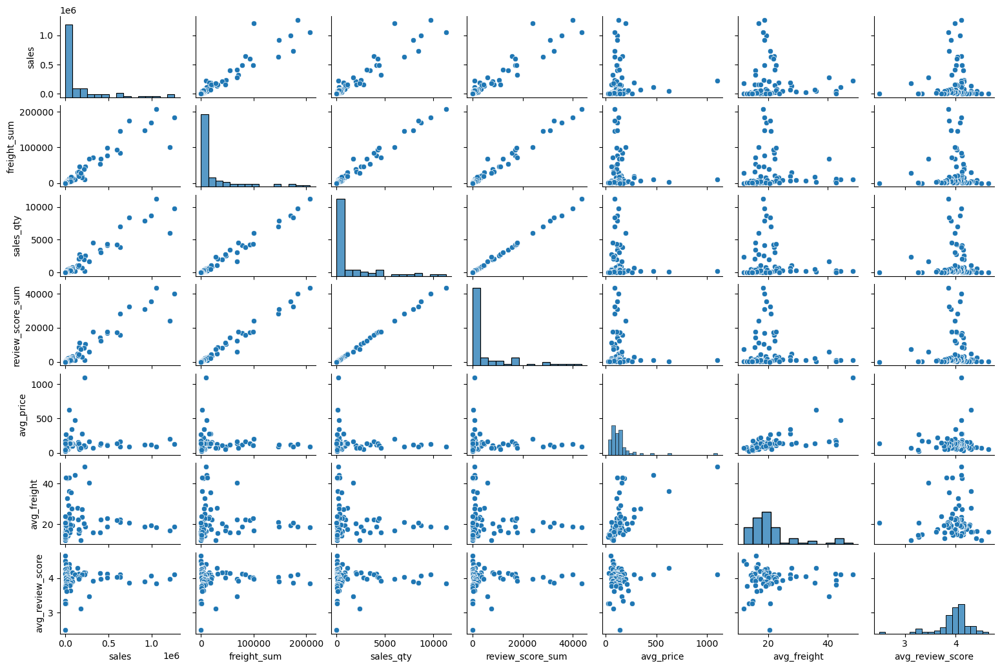

In [116]:
# pairplot of `df_product_aggreg`
sns.pairplot(df_product_aggreg, height=1.5, aspect=1.5)

This pairplot shows interesting information:
 
* The `avearge_review_score` is normally distributed but skewed to left. So we could say that the products are being judged fairly, regardless of the price and the number of sales
* There seems to be a linear relationship between the `sales_qty` (amount of products sold) and `sales` (the amount of sales), which is logical
* There are more low_cost sales than high_cost

In [117]:
# Grouping data
df_product_status_aggreg = df_orders_items_prod_re.groupby(by=['product_category_name','order_status'], as_index=False).agg({'price': 'sum', 
                                                                                                                             'total_value': 'sum', 
                                                                                                                             'order_item_id': 'count',
                                                                                                                             'order_id':'count', 
                                                                                                                             'review_score':'sum', 
                                                                                                                             'delivery_accuracy':'sum'})

# rename the columns
df_product_status_aggreg.columns = ['product_cat', 'order_status', 'sales', 'sales_w_freight', 'order_qty', 'sales_qty', 'review_score_sum', 'delivery_accuracy_sum']
df_product_status_aggreg.reset_index(drop=True, inplace=True)

# Adding new columns for analysis
df_product_status_aggreg['avg_price'] = df_product_status_aggreg['sales'] / df_product_status_aggreg['sales_qty']
df_product_status_aggreg['avg_review_score'] = df_product_status_aggreg['review_score_sum'] / df_product_status_aggreg['sales_qty']    
df_product_status_aggreg['avg_deli_accuracy'] = df_product_status_aggreg['delivery_accuracy_sum'] / df_product_status_aggreg['sales_qty']

print(df_product_status_aggreg.shape)
df_product_status_aggreg.head()

(281, 11)


,product_cat,order_status,sales,sales_w_freight,order_qty,sales_qty,review_score_sum,delivery_accuracy_sum,avg_price,avg_review_score,avg_deli_accuracy
0,agro_industry_and_commerce,delivered,70566.10,76203.30,206,206,842.0,2217.263981,342.553883,4.087379,10.763417
1,agro_industry_and_commerce,invoiced,19.50,28.22,1,1,1.0,0.000000,19.500000,1.000000,0.000000
2,agro_industry_and_commerce,shipped,1944.87,2142.55,5,5,5.0,0.000000,388.974000,1.000000,0.000000
3,air_conditioning,canceled,301.80,337.62,2,2,2.0,0.000000,150.900000,1.000000,0.000000
4,air_conditioning,delivered,53323.56,59854.55,289,289,1151.0,3892.543530,184.510588,3.982699,13.469009


In [118]:
# # pairplot of `df_product_status_aggreg`
# sns.pairplot(df_product_status_aggreg, height=1.5, aspect=1.5)

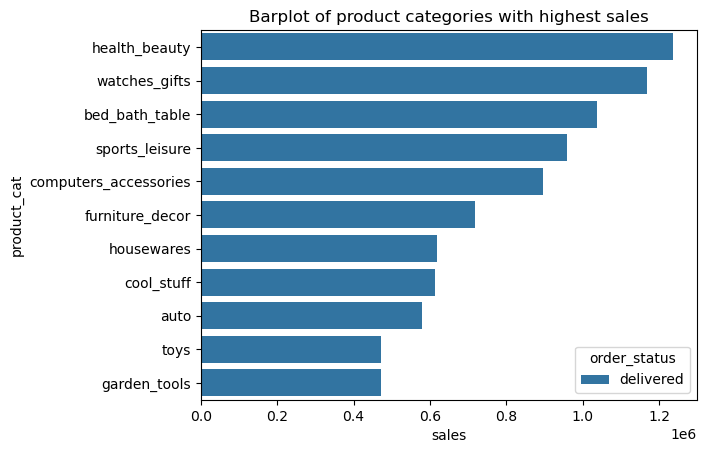

In [119]:
df_product_status_aggreg = df_product_status_aggreg.sort_values(by=['sales'], ascending=False)
sns.barplot(x='sales',y='product_cat',hue='order_status',data=df_product_status_aggreg[:11], orient="h");
plt.title('Barplot of product categories with highest sales')
plt.show()

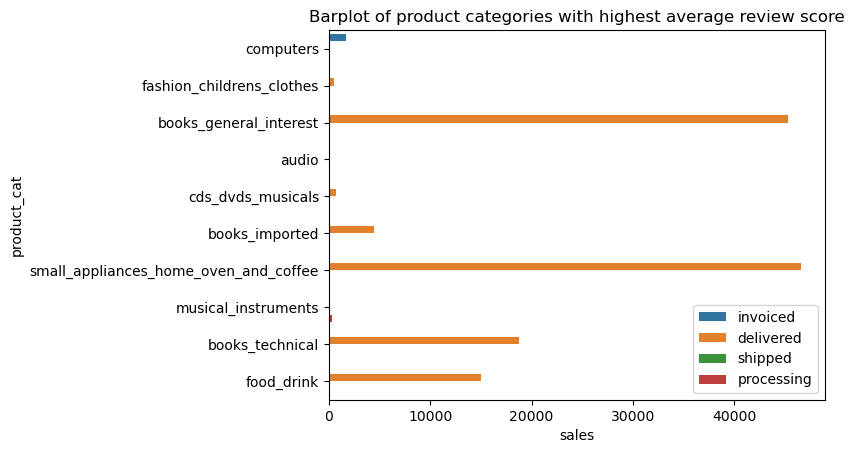

In [120]:
df_product_status_aggreg = df_product_status_aggreg.sort_values(by=['avg_review_score'], ascending=False)
sns.barplot(x='sales',y='product_cat',hue='order_status',data=df_product_status_aggreg[:11], orient="h");
plt.title('Barplot of product categories with highest average review score')
plt.legend(loc='lower right')
plt.show()

<h4>Q7.Delivery time</h4>

<AxesSubplot:title={'center':'Delivery time in days'}, ylabel='Density'>

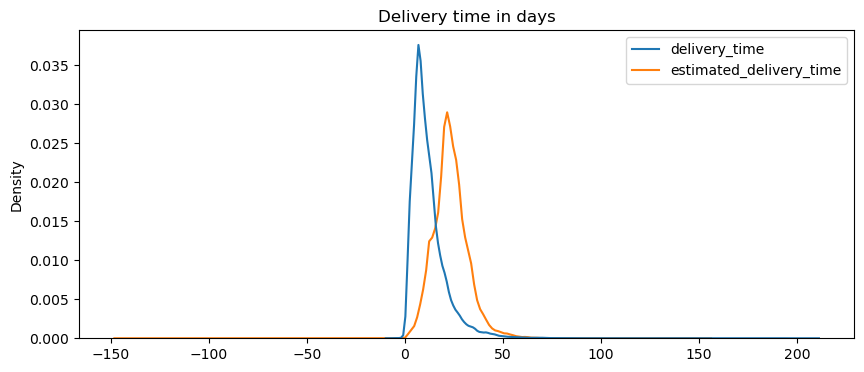

In [121]:
# Calculate differences in hours
df_orders_items_prod_re['delivery_time'] = (df_orders_items_prod_re['order_delivered_customer_date'] - df_orders_items_prod_re['order_approved_at']).dt.total_seconds() / 86400
df_orders_items_prod_re['estimated_delivery_time'] = (df_orders_items_prod_re['order_estimated_delivery_date'] - df_orders_items_prod_re['order_approved_at']).dt.total_seconds() / 86400
df_orders_items_prod_re['delivery_time_delta'] = (df_orders_items_prod_re['order_estimated_delivery_date'] - df_orders_items_prod_re['order_delivered_customer_date']).dt.total_seconds() / 86400
df_delivery_temp = df_orders_items_prod_re[['delivery_time','estimated_delivery_time']]
# Delivery estimated time and actual delivery time
plt.figure(figsize=(10,4))
plt.title("Delivery time in days")
sns.kdeplot(data = df_delivery_temp)
# ax1 = sns.kdeplot(df_orders_items_prod_re['delivery_time'].dropna(), color="#D84E30", label='delivery_time')
# ax2 = sns.kdeplot(df_orders_items_prod_re['estimated_delivery_time'].dropna(), color="#7E7270", label='estimated_delivery_time')

There are some outliers for the delivery time. In the next plot the delivery time was limited to two months and the x-axis is the review score:

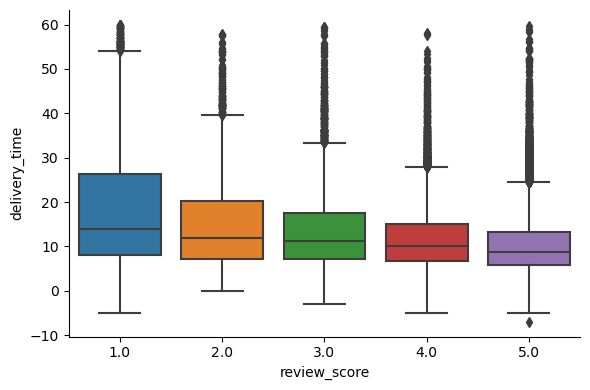

In [122]:
ax = sns.catplot(x="review_score", y="delivery_time", kind="box",
                 data=df_orders_items_prod_re[df_orders_items_prod_re.delivery_time < 60], height=4, aspect=1.5)

Review score increases with shorter delivery time. We observed low variation in the score. Majority of the scores are between 3.5 to5. The product category with lowest score is `security_and_services`

<a id="feature_engrg"></a>
# [&#8629;](#toc) Feature Engineering
create new features for subsequent processes use.

<h3>Holiday </h3>

In [123]:
# Using the API to scrape the holiday and use to the data ('https://date.nager.at/PublicHoliday/Country/BR/2017')
holiday_17 = pd.read_csv('./datasets/publicholiday.BR.2017.csv', parse_dates=['Date'])
holiday_18 = pd.read_csv('./datasets/publicholiday.BR.2018.csv', parse_dates=['Date'])
print(holiday_17.shape, holiday_18.shape)

holiday_1718 = pd.concat([holiday_17,holiday_18], ignore_index=True)
holiday_1718.shape

(13, 9) (13, 9)


(26, 9)

In [124]:
holiday_1718['Date'] = holiday_1718['Date'].apply(lambda x: x.strftime('%Y%m%d'))
holiday_1718['IsHoliday'] = 1
holiday_1718 = holiday_1718[['Date', 'IsHoliday']]
holiday_1718.head()

,Date,IsHoliday
0,20170101,1
1,20170228,1
2,20170414,1
3,20170416,1
4,20170421,1


In [125]:
holiday_1718['Date'] = holiday_1718['Date'].astype(int)
df_orders_items_prod_re['order_purchase_date'] = df_orders_items_prod_re['order_purchase_date'].astype(int)
df_orders_items_prod_re['order_approved_date'] = pd.to_datetime(df_orders_items_prod_re['order_approved_at'])

In [126]:
# merge with holiday dataset
df_orders_items_prod_re = df_orders_items_prod_re.merge(holiday_1718, how ='left', left_on = 'order_purchase_date', right_on = 'Date')
df_orders_items_prod_re = df_orders_items_prod_re.drop(columns = ['Date'])
df_orders_items_prod_re = df_orders_items_prod_re.rename(columns = {'IsHoliday': 'isholiday_order_purchased'})
df_orders_items_prod_re['isholiday_order_purchased'].fillna('0',inplace = True)

df_orders_items_prod_re['order_approved_date'] = df_orders_items_prod_re['order_approved_date'].dt.date
df_orders_items_prod_re['isholiday_order_approved'] = df_orders_items_prod_re['order_approved_date'].isin(holiday_1718['Date']).astype(int)
df_orders_items_prod_re['isholiday_order_approved'].fillna('0',inplace = True)
df_orders_items_prod_re.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,delivery_accuracy,total_value,id,sigla,nome,name_region,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,datetime,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_time,estimated_delivery_time,delivery_time_delta,order_approved_date,isholiday_order_purchased,isholiday_order_approved
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2017,10,201710,Oct,20171002,2,0,Mon,10,Morning,7.107488,38.71,35,SP,São Paulo,southeast,3149.0,-23.583885,-46.587473,sao paulo,SP,housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0,2017-10-02 10:56:33,4.0,NaN,"Não testei o produto ainda, mas ele veio correto e em boas condições. Apenas a caixa que veio bem amassada e danificada, o que ficará chato, pois se trata de um presente.",2017-10-11,2017-10-12 03:43:48,8.429144,15.536632,7.107488,2017-10-02,0,0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,2018,7,201807,Jul,20180724,24,1,Tue,20,Night,5.355729,141.46,29,BA,Bahia,northeast,47813.0,-12.945892,-45.016313,barreiras,BA,perfumery,29.0,178.0,1.0,400.0,19.0,13.0,19.0,2018-07-24 20:41:37,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50,12.502292,17.858021,5.355729,2018-07-26,0,0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,2018,8,201808,Aug,20180808,8,2,Wed,8,Morning,17.245498,179.12,52,GO,Goiás,midwest,75265.0,-16.752735,-48.522139,vianopolis,GO,auto,46.0,232.0,1.0,420.0,24.0,19.0,21.0,2018-08-08 08:38:49,5.0,NaN,NaN,2018-08-18,2018-08-22 19:07:58,9.382708,26.628206,17.245498,2018-08-08,0,0


In [127]:
# do a filter and count 
df_orders_items_prod_re[df_orders_items_prod_re['isholiday_order_purchased'] == 1]['price'].sort_values(ascending=False).describe()

count    2861.000000
mean      118.182884
std       172.300180
min         3.500000
25%        39.990000
50%        70.000000
75%       134.900000
max      2749.650000
Name: price, dtype: float64

In [128]:
# do a filter and count 
df_orders_items_prod_re[df_orders_items_prod_re['isholiday_order_approved'] == 1]['price'].sort_values(ascending=False).describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: price, dtype: float64

<h3>Category similarity </h3>

In [129]:
# Filling in average values for missing product values
def fill_average(df, cols):
    '''
    Function takes in name of a data frame and list of columns to substitute, na cells will be filled with mean
    '''
    for col in cols:
        df[col] = df[col].fillna(df[col].mean())

In [130]:
fill_average(df_orders_items_prod_re, ['product_length_cm', 'product_weight_g', 'product_height_cm', 'product_width_cm'])

In [131]:
# rename columns
df_orders_items_prod_re.rename(columns = {'order_item_id':'qty'}, inplace=True)
# column of product size
df_orders_items_prod_re['product_m3'] = df_orders_items_prod_re['product_length_cm']*df_orders_items_prod_re['product_height_cm']*df_orders_items_prod_re['product_width_cm']/(10**6)*df_orders_items_prod_re['qty']
df_orders_items_prod_re.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,qty,product_id,seller_id,shipping_limit_date,price,freight_value,order_purchase_year,order_purchase_month,order_purchase_year_month,order_purchase_month_name,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day,delivery_accuracy,total_value,id,sigla,nome,name_region,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,datetime,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,delivery_time,estimated_delivery_time,delivery_time_delta,order_approved_date,isholiday_order_purchased,isholiday_order_approved,product_m3
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.0,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,2017,10,201710,Oct,20171002,2,0,Mon,10,Morning,7.107488,38.71,35,SP,São Paulo,southeast,3149.0,-23.583885,-46.587473,sao paulo,SP,housewares,40.0,268.0,4.0,500.0,19.0,8.0,13.0,2017-10-02 10:56:33,4.0,NaN,"Não testei o produto ainda, mas ele veio correto e em boas condições. Apenas a caixa que veio bem amassada e danificada, o que ficará chato, pois se trata de um presente.",2017-10-11,2017-10-12 03:43:48,8.429144,15.536632,7.107488,2017-10-02,0,0,0.001976
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.0,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,2018,7,201807,Jul,20180724,24,1,Tue,20,Night,5.355729,141.46,29,BA,Bahia,northeast,47813.0,-12.945892,-45.016313,barreiras,BA,perfumery,29.0,178.0,1.0,400.0,19.0,13.0,19.0,2018-07-24 20:41:37,4.0,Muito boa a loja,Muito bom o produto.,2018-08-08,2018-08-08 18:37:50,12.502292,17.858021,5.355729,2018-07-26,0,0,0.004693
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.0,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,2018,8,201808,Aug,20180808,8,2,Wed,8,Morning,17.245498,179.12,52,GO,Goiás,midwest,75265.0,-16.752735,-48.522139,vianopolis,GO,auto,46.0,232.0,1.0,420.0,24.0,19.0,21.0,2018-08-08 08:38:49,5.0,NaN,NaN,2018-08-18,2018-08-22 19:07:58,9.382708,26.628206,17.245498,2018-08-08,0,0,0.009576
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,2017,11,201711,Nov,20171118,18,5,Sat,19,Night,12.980069,72.20,24,RN,Rio Grande do Norte,northeast,59296.0,-5.778488,-35.281450,sao goncalo do amarante,RN,pet_shop,59.0,468.0,3.0,450.0,30.0,10.0,20.0,2017-11-18 19:28:06,5.0,NaN,O produto foi exatamente o que eu esperava e estava descrito no site e chegou bem antes da data prevista.,2017-12-03,2017-12-05 19:21:58,13.196331,26.176400,12.980069,2017-11-18,0,0,0.006000
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,

In [132]:
# create category-order grouped dataframe 
df_order_class_comp = df_orders_items_prod_re.groupby(['order_id', 'product_category_name'], as_index = False).agg({
    'product_id':'count', 'qty':'sum', 'price':'sum', 'product_m3':'sum', 'product_weight_g':'sum', 'delivery_time':'first', 
    'estimated_delivery_time':'first', 'delivery_time_delta':'first', 'order_purchase_timestamp':'first'})
# rename column
df_order_class_comp.rename(columns={'qty':'total_qty', 'price':'total_price', 'product_m3':'total_m3', 'product_weight_g': 'total_weight'}, inplace=True)
df_order_class_comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100245 entries, 0 to 100244
Data columns (total 11 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   order_id                  100245 non-null  object        
 1   product_category_name     100245 non-null  object        
 2   product_id                100245 non-null  int64         
 3   total_qty                 100245 non-null  float64       
 4   total_price               100245 non-null  float64       
 5   total_m3                  100245 non-null  float64       
 6   total_weight              100245 non-null  float64       
 7   delivery_time             97261 non-null   float64       
 8   estimated_delivery_time   100085 non-null  float64       
 9   delivery_time_delta       97275 non-null   float64       
 10  order_purchase_timestamp  100245 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(7), int64(1), object(2)
memory usag

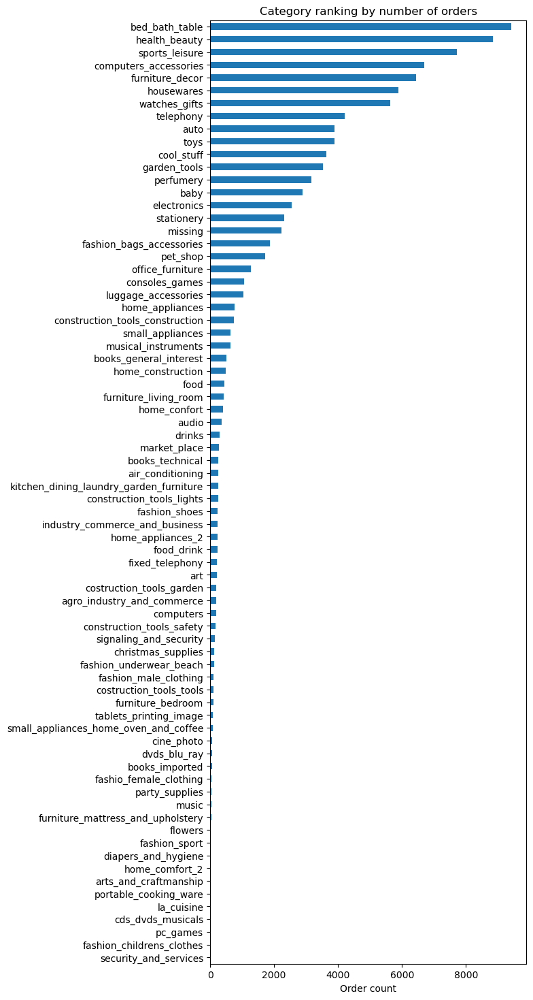

In [133]:
df_order_class_comp.groupby('product_category_name')\
    .agg({'order_id': 'count'})\
    .sort_values('order_id')\
    .plot(kind='barh', figsize=(6,18), legend=False);
plt.title('Category ranking by number of orders')
plt.ylabel('');
plt.xlabel('Order count');

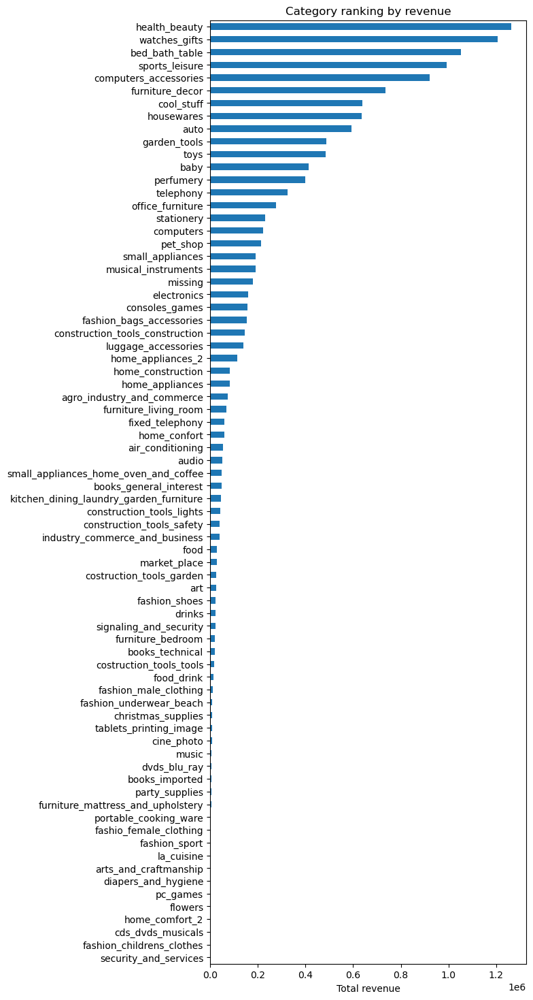

In [134]:
# Product category ranking by revenue
df_order_class_comp.groupby('product_category_name')\
    .agg({'total_price': 'sum'})\
    .sort_values('total_price')\
    .plot(kind='barh', figsize=(6,18), legend=False);
plt.title('Category ranking by revenue')
plt.ylabel('');
plt.xlabel('Total revenue');

In [135]:
# Creating a function that returns a sparse matrix
def create_category_order_matrix(df, row, col, elm):
    '''
    Description:
    Return a matrix with order IDs as rows and category names on the columns with count of values where an order contained the product category

    Arguments:
    df - pandas dataframe
    row - field name to be used for the rows
    col - field name to be used for the columns
    elm - field name to be used as matrix elements (counte values)
    
    Return:
    mat_cat_order - category-order matrix 
    
    '''
    mat_cat_order = df.groupby([row, col]).agg({elm: 'count'}).unstack().fillna(0)
    
    return mat_cat_order # return the user_item matrix

In [145]:
# # Sparse matrix for categoy - orders
# mat_cat_order = create_category_order_matrix(df_order_class_comp, 'product_category_name', 'order_id', 'total_qty')
# mat_cat_order.head(3)

In [137]:
# Any order contained two articles of the same category?
len(np.where(mat_cat_order > 1))

2

Let's experiment and develop an algorithm which returns similar categories based on the order history (Collaborative Filtering based on dot-product). I will use the new sparse matrix to do this.

In [138]:
def find_similar_categories(product_category_name, mat_cat_order=mat_cat_order):
    '''
    A function that calculates the similarity of every pair of category based on the dot product

    INPUT:
    product_category_name - (str) a product category name
    mat_cat_order - (Numpy matrix) matrix of product category by order ID: 
                The matrix elements are counts of instances.
    
    Output:
    similar_categories - Ordered list where the closest category are listed first
    '''
    # Calculate similarity and sort
    lst_orders = mat_cat_order.loc[product_category_name]
    arr_category = (mat_cat_order.index.tolist())
    unique_categories = len(mat_cat_order)
    
    dist_to_cat = []
    for cat in range(unique_categories):
        dist_to_cat.append(np.dot(lst_orders, mat_cat_order.iloc[cat]))
        
    df_dists = pd.DataFrame({
        'category': arr_category,
        'dist_to_cat': dist_to_cat
    }).sort_values('dist_to_cat', ascending=False)[1:]

    # create list of just the ids
    similar_categories = df_dists['category'].tolist()
   
    # remove the own user's id
    
    return similar_categories # return a list of the categories in order from most to least similar

In [139]:
# Let's check some categories
print('5 most similar categories to "bed_bath_table": {}'.format(find_similar_categories('bed_bath_table')[:5]))
print('5 most similar categories to "sports_leisure": {}'.format(find_similar_categories('sports_leisure')[:5]))
print('5 most similar categories to "watches_gifts": {}'.format(find_similar_categories('watches_gifts')[:5]))

5 most similar categories to "bed_bath_table": ['furniture_decor', 'home_confort', 'housewares', 'baby', 'health_beauty']
5 most similar categories to "sports_leisure": ['health_beauty', 'housewares', 'missing', 'watches_gifts', 'toys']
5 most similar categories to "watches_gifts": ['furniture_decor', 'audio', 'sports_leisure', 'health_beauty', 'stationery']


The above algorithm can be used for categorization in later part.

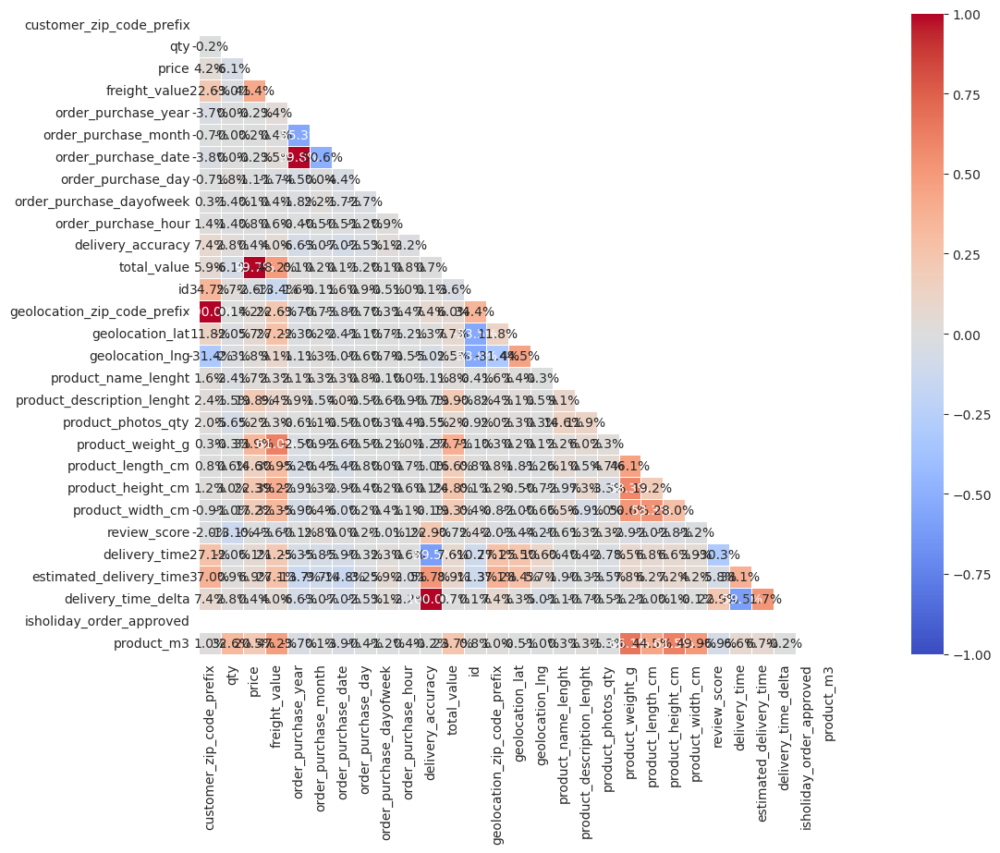

In [140]:
# Heatmap of correlation
# Establish size of figure.
plt.figure(figsize = (20,9))

# Get correlation of variables. (statistical significance)
corr = df_orders_items_prod_re.corr()

# Set up mask to be "True" in the upper triangle.
# because it will be the mirror image of lower triangle we'll see on our plot.
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Plot our correlation heatmap, while masking the upper triangle to be white.
with sns.axes_style("white"):
    sns.heatmap(corr, mask = mask, square = True, annot = True, fmt = ".1%", vmin = -1, vmax = 1, linewidths = .5, cmap='coolwarm')

<h2> Save to csv </h2>

In [141]:
def save_csv(df, file_name):
    """Saves dataframe to csv.
    Args:
    data -- a pandas dataframe
    file_name -- name for storing csv file
    """
    df.to_csv(f'./datasets/{file_name}.csv')

In [142]:
# save into csv
save_csv(df_orders_items_prod_re, 'orders_items_prod_re')
save_csv(orders_daily_df, 'orders_daily_df')
save_csv(orders_daily, 'orders_daily')
save_csv(osc_daily, 'osc_daily')
save_csv(osc_pur_daily, 'osc_pur_daily')

<h3> Extract Top 10 Product Categories into Separate Files </h3>

In [143]:
def extract_prod_cat(category):
    temp_df = df_orders_items_prod_re[df_orders_items_prod_re['product_category_name'].isin(category)]
    return temp_df.to_csv(f"./datasets/category.csv")

In [144]:
extract_prod_cat(top_categories)

<a id="summary"></a>
# [&#8629;](#toc) Summary

Datasets are merged sequentially and information is extracted and aggregated to meet the purpose of the visualisation.

Summary of observation from the extensive EDA process:
- From the statistics graph, the status with highest count of the orders is *delivered* (97%). Whileas the remaining orders is spread among the other statuses.
- Concept of `ETL` is applied, such as to extract time attributes from timestamp columns, transform to different datetime columns (year, month, day, day of the week and hour), analyze the e-commerce scenario using these attributes. 
- Customers tend to shop online on weekdays from 10am to 5pm. There are sudden peaks on Monday-Wednesday night around 8-9pm and on Sunday evening 6-8pm. Online shopping count is relatively low on Saturday.
- The delivery heatmap shows that Weekday 2-10pm are the busiest time for delivery operators. Morning periods is generally the time with less deliveries. 
- E-Commerce in Brazil has positive growing trend along the time. There is some seasonality with peaks at certain months, in general we clearly see that customers are more keen to buy things online than before.
- Monday and Tuesday are the preferred days for Brazilian customers and more puchases are made in the afternoon.
- There is sharp decrease after August 2018, it may due to the noise on data or incomplete data. For comparison purposes, we focus on orders between January and August for both 2017 and 2018. 
- Between January and August, total orders registered in 2018 has 142% more than in 2017.
- An [API](https://servicodados.ibge.gov.br/api/docs/localidades?versao=1) (brazilian government) was used to return the region of each customer_state, merge this data with orders_items_df to remove any possible outliers.
- There are five main regions where the purchases demand are coming from, top region being the southeast. São Paulo is the most populous city in Brazil, it has the highest number of sales among all. Follows by city Rio de Janeiro (capital of Brazil 1763-1960). While the current capital of Brazil, Brasilia, is the fourth capital with most orders.
- We analyzed the money movement of e-commerce. Highest amount sales sold in this dataset was R$ 1010.3K on November 2017, which was possibly the result of Black Friday (Nov 24). Total sales amount of R$7.39Mil generated between January and Auguest 2018. Freight for most months in 2018 are higher than in 2017.
- It's very interesting to see some states with a high total amount sold but low price per order. For example, in SP (São Paulo) state, it has the most value of e-commerce (5,188,099 sold) but it is also where customers pay less per order (110.00 per order).
- Here we can get insights about the customers states with highest mean freight value. For example, customers in Roraima (RR), Paraíba (PB), Rondônia (RO) and Acre (AC) normally pays more than anyone on freights.
- The mean value of freight paid for online shopping is R$19.99. It generally takes average of 8 working days for online shoppng delivery. While the avearge difference between delivery and estimated date is -8 working days, which means delivery is faster than estimated. 
- From the line chart, it shows that majority of brazilian e-commerce customers made payments by credit card. Since May 2018 it's possible to see a slight decrease on this type of payment. On the other hand, payments made by debit card is showing a growing trend since May 2018, wich is a good opportunity for investors to improve services for payments like this.
- On the bar chart, it reflects that brazilian customers prefer to pay the orders: mostly of them pay all in one installment and it's worth to point out that payment in 10 installments comes after the quantity of payments done in 4 installments.
- 89638 of customers purchased once (single order_id) while another group of customers (7516) are repeating customers.
- Both supply by sellers and demand from the customers exist in Olist. However, we have no information on when a product was first launched for purchase. This is relevant beacuse it would allow us to analyze the relationship between supply (product availability) and demand (purchase of products). It seems that the product information we have is only related to purchased items which makes it fully derived and dependent from the demand side.
- Product price and freight value exhibits same distribution pattern. As expected, both price and freight value plots are right skewed histogram - most of the times, people buy cheaply priced goods on Olist.
- There are some sales in October 2016, but almost nothing in the next two months.
- There is a spike in products price in July 2018, but not in freight.
- The unique counts of orders, products, sellers and customers have similar cumulative distribution function. All of them skew to the right and in the case of daily unique orders, it reached 90% at around 300 orders but reached 100% at over thousand orders.
- The orders between October 2016 and January 2017 are very little to almost zero, we'll be removing this interval from the dataset for our modelling.
- It looks like there is steady gradual upwards trend in the first 3 quarters of 2017 follow with huge spike in November and December 2017. From the spike at the end of 2017 onwards, daily orders oscillate much more heavily and it's hard to tell if there is any trend at all. There are two additional huge spikes in the second and third querter of 2018.
- Moving averages was applied to time series plot at different granularity to observe the trends through smoothening. Through these averaged, we can definitely better recognize the steady growth through 2017 but also no growth in the first two quarters of 2018 and then a dip in the middle of the 3rd quarter of 2018. 
- There are 74 categories for which a product was shipped as part of an order any given point in time. The top 10 categories make up 63% of the total products sold during the two years of data.
- The top most selling product category is `bed_bath_table`, followed by `health_beauty` and `sports_leisure`.
- Almost all the top ten categories maintained same monthly share of products sold with some fluctuation, however we observed some odds such as huge drop for furniture_decor products on beginning of 2017 and spike for computer_accessories on March 2018.
- Heatmap was built to spot the trend with time for top ten categories. The top category for the two years of data `bed_bath_table` consistently takes around 8% to 10% of monthly products sold. `health_beauty` has an upwards trend starting in the lower 7% and ending the last months of the series above 10% from total monthly sold products, overtaking bed_bath_table as the top category for these months. The categories `housewares` and `watches_gifts` had an upwards trends for their share of total products sold towards the end of the series, while `sports_leisure` and `furniture_decor` had a downwards trend as time went on.
- In terms of the share from total monthly products sold per city, we can see that as the number of products sold increased (see figue 'Monthly Products Sold'), the share of Sao Paolo increased as well, meaning that most of the growth in products sold came from customers in Sao Paolo. Rio de Jairo has a more or less constant share of between 6% to 8%. All other cities, the long tail, seem to have a mothly share of 2% or less.
- From the heatmap, all cities seem to have a similar percentage change to their cumulative monthly products sold. This means that in overall, their cumulative plots have a similar shape even though the absolutes might be of different magnitudes.
- We conducted seasonlity check with using stationary test. 
- The exponentially weighted average places more weight on days closer to the day for which the average is being calculated. There is in fact a daily seasonality, high number of customers orders are consistently being approved on Tuesday than any other day of the week. It also seems that Wednesday is the second day where most orders are approved.
- Until December 2017, according to the Dickey-Fuller test, the times series is not stationary and it clearly has a trend upwards. The p-value is 98% for this time range. The rest of the time series seems to be stationary, the test confirming the null hypothesis with a very low p-value. Let's plot p-values for the interval ranges of 3 months to see how consistent the above results are.
- Scores are usually good and the bad ones seems to be related to slightly more expensive products (or considerable orders).
- We observed low variation in the score. Majority of the scores are between 3.5 to5. The product category with lowest score is `security_and_services`
- `Fashion_childrens_clothes` has the highest average score of 4.64 among all product categories.
- Scores are usually good (value of 4/5) and the bad (value of 1) ones seems to be related to slightly on more expensive products (or considerable orders).
- Review score increases with shorter delivery time. We observed low variation in the score. Majority of the scores are between 3.5 to5. The product category with lowest score is `security_and_services`
- Some new features being engineered along the EDA processes, such as time attributes, holiday, region.
- Interested to explore category simialrity algorithmn potentially used for recommender system, but this will be future work.